# Project One

## Introduction

In the 2020 U.S. Presidential Election, incumbent president Donald Trump faced off against Joe Biden, ultimately resulting in Trump's defeat. Among the myriad reasons speculated for Trump's loss, his mishandling of the COVID-19 crisis, which eventually led to approximately a million deaths, has been widely discussed as a significant factor.

COVID-19 was a significant Public Health issue in the U.S. starting in early 2020. By the date of the 2020 U.S. Presidential Election, over 200,000 people died due to the COVID. In terms of the influences of COVID-19 on the Federal Elections, David's research paper [1] provides an intriguing perspective on the role that COVID-19 played in the election. David [1] suggested that polarization and partisanship played an unignorable role in the handling of COVID-19, and this directly impacted the results of the 2020 Election. At the start of 2020, Democratic and Republican constituencies displayed differing attitudes towards the pandemic, with more Democrats concerned or very concerned about COVID than Republicans. And this difference was directly reflected in the trajectory of COVID cases and deaths in different counties. 

In addition, David also suggests that in the early months of 2020, even the more supportive counties to Trump had a relatively smaller number of cases and deaths than the less supportive counties. As time goes to July and August, the more supportive counties seem to have more COVID cases or deaths, but there was a decline in less supportive counties. He suggested that there was a strong association between the number of COVID cases or fatalities and the party they support for each county. However, in David's research, he only used the voting data from 2016 as a reference of voting data. His research did not contain the 2020 voting patterns, which makes his work less convincing, but it is a good intuition behind the scenes. 

In contrast, Leonardo et al. [2] combined the 2020 U.S. Election results and both socio-economic and demographic data to conclude that there was a negative impact of COVID-19 on Donald Trump's vote share by using OLS and 2SLS models. Especially on their 2SLS models, they chose the share of employment in meat processing factories to be the instrument in their first stage and found a more negative relation between Trump's vote share and COVID cases. In addition, they also found that COVID was more severe in urban counties and states without stay-at-home orders, which matches David's research. However, Leonardo et al. [2] attribute Trump's electoral failure solely to the pandemic, overlooking other socio-economic factors. The COVID was the only factor contributing to Trump's defeat. This viewpoint contrasts with Marcus et al. [3], who argued that both the direct impact of COVID-19 and the secondary impact of economic factors played significant roles in the election outcome. 

Marcus et al.'s work mainly concentrates on the voting pattern if there is no COVID-19. Leonardo et al. used the change in percentage votes for Trump from 2016 as their dependent variable, and their independent variables covered the factors of COVID, demographics, and the economy. Unlike most researchers, they consider the change in labor force and trade factors and include them in their models. From their models, they conducted counterfactual research to find the change in voting patterns in each state with different levels of mitigation of COVID. In this process, the change in the labor force and the share of manufacturing on employment are always significant to predict the change in Trump's vote share. If there could be at least a 20% reduction in COVID severity, Trump can be re-elected.

The previous three articles use the voting results in 2016 or 2020 or the change. Unlike them, Joshua [3] did an actual experimental design, which conducted a real survey in six weeks, and the first five weeks started from March to May 2020. The surveys ask participants about their political affiliation and whether they are concerned about the pandemic. Then, they were randomly assigned into two groups: pandemic priming or no priming. From these surveys, there was an interesting pattern: the people concerned about COVID continuously supported Trump even though the pandemic started, and people who were not worried about COVID lowered their support after the pandemic began. However, in June, no matter whether the participants were concerned about COVID, both of the groups showed a dramatic decrease in support for Trump.

Regarding political affiliation, people who support Democrats have a neutral or negative attitude toward Trump. However, people's attitude toward Trump depends on their concerns about COVID. In the earlier stage of the COVID lockdown, most of them elevated their support to Trump. But the support suddenly decreased in June, especially when he announced that the county would recover soon.

From these papers, it seems that each of them concludes a negative impact of COVID on Trump's vote share. Leonardo et al. [2] and Marcus et al. [3] did counterfactual research showing that Donald Trump can win if there is a certain decrease in COVID severity or cases. Combining their research, my project will concentrate on the impact of COVID-19 on the 2020 U.S. Election results while accounting for economic considerations. With this in mind, my research question will be: **Has Donald Trump's handling of the COVID-19 crisis significantly affected his voting results in the 2020 U.S. presidential election?** Through this project, I aim to determine if Trump's mismanagement of the pandemic contributed to his electoral loss. If it did, to what extent? Additionally, the study will explore how economic variables, particularly disparities in county income per capita, impacted the voting preferences. The research will be segmented into two main sections, and the findings will be elucidated through various tables and visualizations.

Furthermore, I'll utilize a dataset sourced from Kaggle [5]. This dataset combines different data sources, including voting results from the 2016 and 2020 U.S. Elections, demographic and economic metrics from 2017, and COVID-19 data up to November 1, 2020. Each data source is delineated at the county level, providing a more localized perspective. As the COVID-19 data was collected in the election in just a few days and the voting usually took place early, it's plausible to explore potential correlations between voting trends and COVID-19 statistics.

## Data Cleaning/Loading

According to our research question, the dependent variable in our study is the voting numbers for Donald Trump in the 2020 election across various counties. As for the independent variables, there are four in total: the income per capita of each county, the unemployment rate in each county, and the number of COVID-19 cases and deaths in each county.

Each of these independent variables may have the potential to influence voting patterns. The demographic and economic variables (like income per capita and unemployment rate) indicate the socio-economic landscape of the counties and reflect the candidate's policies. People may vote for the candidates based on their own socio-economic experiences and the realities they face daily. For instance, a voter from a county with a high income per capita may be more inclined to support a candidate who emphasizes policies that protect their financial interests. Conversely, people living in a county with a high unemployment rate may be more likely to vote for the candidates who advocate for job creation. Likewise, the COVID-19-related variables (cases and deaths) may also provide insights into how the pandemic might affect their voting decisions. Voters'choices could be based on the candidates' stances on COVID-19 response and management. 

All the independent variables are closely related to our research question. They consist of the socio-economic variables, which we usually consider in an Election, and COVID variables, which could tell us the relationship between COVID and voting patterns. Through this, we can figure out how the pandemic shaped Donald Trump's electoral outcome and whether it was a critical factor in his defeat.

I will proceed to clean and preprocess the dataset in the subsequent sections.

In [1]:
import matplotlib
import matplotlib.colors as mplc
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression

In [2]:
# This is the data cleaning process
# Load the data
data = pd.read_csv("county_statistics.csv")
df = pd.DataFrame(data)
# Select the variables that we are interested
df = df[["percentage20_Donald_Trump", "percentage16_Donald_Trump", "percentage20_Joe_Biden", "IncomePerCap", "Unemployment", "cases", 
         "deaths", "state", "county", "long", "lat", "TotalPop"]]

# Drop all rows containing at least one missing observation
df = df.dropna()

The above table shows the first five rows on the cleaned dataset. We can see that the cleaned dataset has eleven columns.

During the data cleaning process, there are two primary steps. First, we narrowed our data set, and second to eliminate any observations that had missing values in any of the variables. Our dataset now comprises eleven variables (columns), and all observations contain no missing values. By the way, even though there are about eleven variables remaining in our dataset, we will only use five of them (our Y and X variables) in the Project One. The rest variables will be used in Project Two and I will explain them by then.

## Summary Statistics Tables

After we clean our data, the next step is summarising all the variables. I will summarise the dependent first and then the independent variables by groups.

For the dependent variable Y: the percentage of vote for Donald Trump in each county

**Table 1.3.1:** The summary statistics for the percentage vote for Donald Trump in 2020 Election

|           Name                | Type  |  count |   mean |    std |   min |   25% |   50% |   75% |   max |
|:------------------------------|------:|-------:|-------:|-------:|------:|------:|------:|------:|------:|
| Percentage Vote for Trump     | Float |  46    | 0.6565 | 0.1563 |  0.04 | 0.568 | 0.688 | 0.776 | 0.962 |


The Table 1.3.1 shows the summary statistics for the percentage vote for Donald Trump in the 2020 US Election for each county. From the table, we can see that our data set records the voting information for 3048 counties. The minimum and maximum voting percentages for Donald Trump are 0 and 0.962. In addition, the mean and median of the percentage voting for Donald Trump were 0.656432 and 0.688, respectively.

**Table 1.3.2:** The summary statistics for the unemployment rate and income per capita in all counties

|        Name       | Type  |   count |       mean |       std |   min |     25% |   50% |     75% |     max |
|:------------------|------:|--------:|-----------:|----------:|------:|--------:|------:|--------:|--------:|
| Income Per Capita | Float |  3046   | 25914.9    | 6115.95   | 10960 | 21782   | 25211 | 28940.8 | 69529   |
| Unemployment Rate | Float |  3046   |     6.3151 |    2.9718 |     0 |     4.4 |     6 |     7.8 |    28.7 |


The Table 1.3.2 shows the summary statistics for the demographic/Economic independent variable: Income Per Capita and Unemployment rate. We can observe about a sixty thousand dollar difference between the minimum and maximum income per capita across all counties in the US. Moreover, the mean and median income per capita across all counties are approximately the same, which is around 25000. In addition, even though the median and mean unemployment rate is about 6%, the maximum unemployment rate is 28.7%, a sharp contrast to the minimum (0%). 

**Table 1.3.3:** The summary statistics for the COVID cases and deaths

|     Name     |  Type  | count |      mean |       std |   min |    25% |   50% |     75% |    max |
|:-------------|-------:|------:|----------:|----------:|------:|-------:|------:|--------:|-------:|
| COVID cases  | Float  | 3046  | 2902.46   | 10817.5   |     0 | 241.25 | 654.5 | 1794.75 | 309190 |
| COVID deaths | Float  |  3046 |   72.7331 |   342.062 |     0 |   3    |  11   |   36    |   7404 |


The Table 1.3.3 displays the summary statistics for the COVID independent variables. If we look at the COVID cases, we can see that the number of cases has a vast span, from 0 to below 310k. There is also a gap between the mean and median number of COVID cases (2900 vs. 654). The death number is not as exaggerated as the case number, but still unignorable. The most severe county has 7404 people who died due to COVID, and there is about a mean of 72 people who died due to COVID in each county.

**Table 1.3.4:** The summary statistics for Donald Trump's vote percentage based on income groups.

|           Name                | Type  | count |   mean |    std |   min |   25% |   50% |    75% |   max |
|:------------------------------|------:|------:|-------:|-------:|------:|------:|------:|-------:|------:|
| Vote% in Wealthier Counties   | Float |  1524 | 0.6875 | 0.1438 | 0.135 | 0.615 | 0.726 | 0.7902 | 0.933 |
| Vote% in Poorer Counties      | Float |  1522 | 0.6256 | 0.162  | 0.04  | 0.528 | 0.645 | 0.741  | 0.962 |

The Table 1.3.4 shows the summary statistics of percentage vote for Donald Trump based on the incoem per capita. In wealthier counties, Trump's average vote was about 68.75%, with the middle half of these counties voting between 61.5% and 79.02%. On the flip side, poorer counties gave him an average of 62.56%, and their middle half voted between 52.8% and 74.1%. Notably, while the vote percentages in poorer counties span a broader range (from 4% to 96.2%) compared to wealthier counties (from 13.5% to 93.3%), more wealthier counties voted for Trump at a rate of 70% or higher compared to their poorer counterparts.

**Table 1.3.5:** The summary statistics for Donald Trump's vote percentage based on unemployment groups.

|                                     | Type  |  count |   mean |    std |   min |    25% |   50% |   75% |   max |
|:------------------------------------|------:|-------:|-------:|-------:|------:|-------:|------:|------:|------:|
| Vote% in Low Unemployment Counties  | Float |   1527 | 0.6763 | 0.1498 | 0.127 | 0.5935 | 0.703 | 0.787 | 0.962 |
| Vote% in High Unemployment Counties | Float |   1519 | 0.6367 | 0.1601 | 0.04  | 0.544  | 0.667 | 0.758 | 0.926 |


Table 1.3.5 shows the percentage vote for Trump but divide into another two groups based on the unemployment rate. Trump earned an average vote of 67.63%, and half of these counties voted between 59.35% and 78.7% in the low unemployment counties. Meanwhile, in areas with higher unemployment, his average dips slightly to 63.67%, with the central half of these counties casting votes within the 54.4% to 75.8%.

By summarising all the variables, some essential values need to be noticed, such as the gap between the maximum and minimum percentage voting for Donald Trump. In the next part, I will draw plots to look at the data better and find potential voting patterns.

## Plots, Histograms, Figures

Text(0, 0.5, 'Number of Counties')

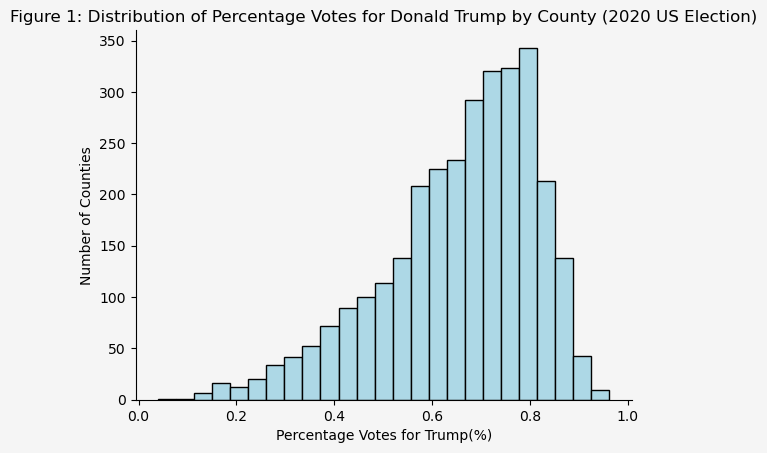

In [3]:
fig, ax = plt.subplots()
df.plot(
    kind="hist", y="percentage20_Donald_Trump", color='lightblue', edgecolor='black',
    bins=25, legend=False, density=False, ax=ax
)
ax.set_facecolor((0.96, 0.96, 0.96))
fig.set_facecolor((0.96, 0.96, 0.96))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_title("Figure 1: Distribution of Percentage Votes for Donald Trump by County (2020 US Election)")
ax.set_xlabel('Percentage Votes for Trump(%)')
ax.set_ylabel('Number of Counties')

Figure 1 shows the distribution of vote percentages that Donald Trump received across different counties during the 2020 US Election. The distribution appears left-skewed, with a concentration between 60% to 80%. This suggests that Trump secured more than half of the votes in most counties.

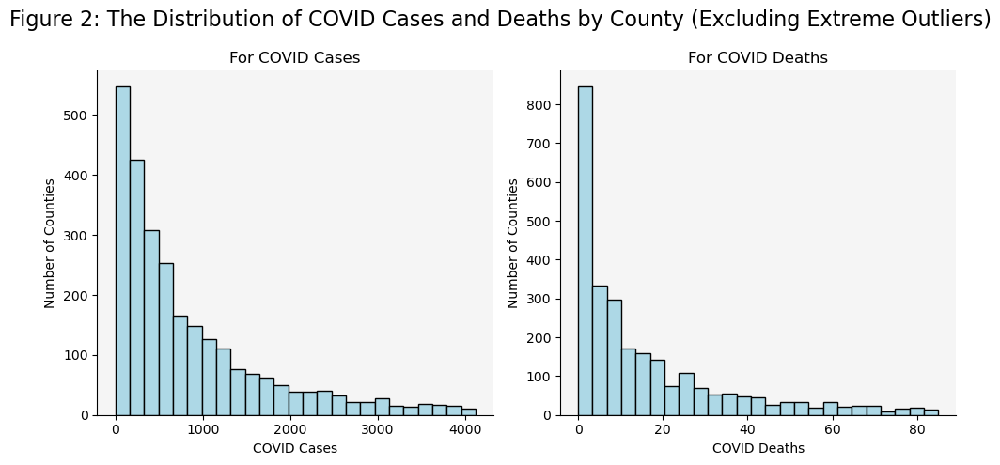

In [4]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# First Histogram (Cases)
filtered_data1 = df[df['cases'] < 1794 + 1.5*(1794-241)]
filtered_data1.plot(
    kind="hist", y="cases", color='lightblue', edgecolor='black',
    bins=25, legend=False, density=False, ax=ax1
)
ax1.set_facecolor((0.96, 0.96, 0.96))
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_title("For COVID Cases")
ax1.set_xlabel('COVID Cases')
ax1.set_ylabel('Number of Counties')

# Second Histogram (Deaths)
filtered_data2 = df[df['deaths'] < 36 + 1.5*(36-3)]
filtered_data2.plot(
    kind="hist", y="deaths", color='lightblue', edgecolor='black',
    bins=25, legend=False, density=False, ax=ax2
)
ax2.set_facecolor((0.96, 0.96, 0.96))
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.set_title("For COVID Deaths")
ax2.set_xlabel('COVID Deaths')
ax2.set_ylabel('Number of Counties')

fig.suptitle("Figure 2: The Distribution of COVID Cases and Deaths by County (Excluding Extreme Outliers)", fontsize=16)
fig.tight_layout()
fig.subplots_adjust(top=0.85)

Figure 2 illustrates the distributions of COVID-19 cases and deaths across various counties, excluding those with exceptionally high numbers. Both distributions exhibit a right-skewed pattern and concentrative between 0 to 1000 and 0 to 20, respectively. This indicates that most counties reported fewer than 1,000 COVID-19 cases and fewer than 20 deaths due to the virus.

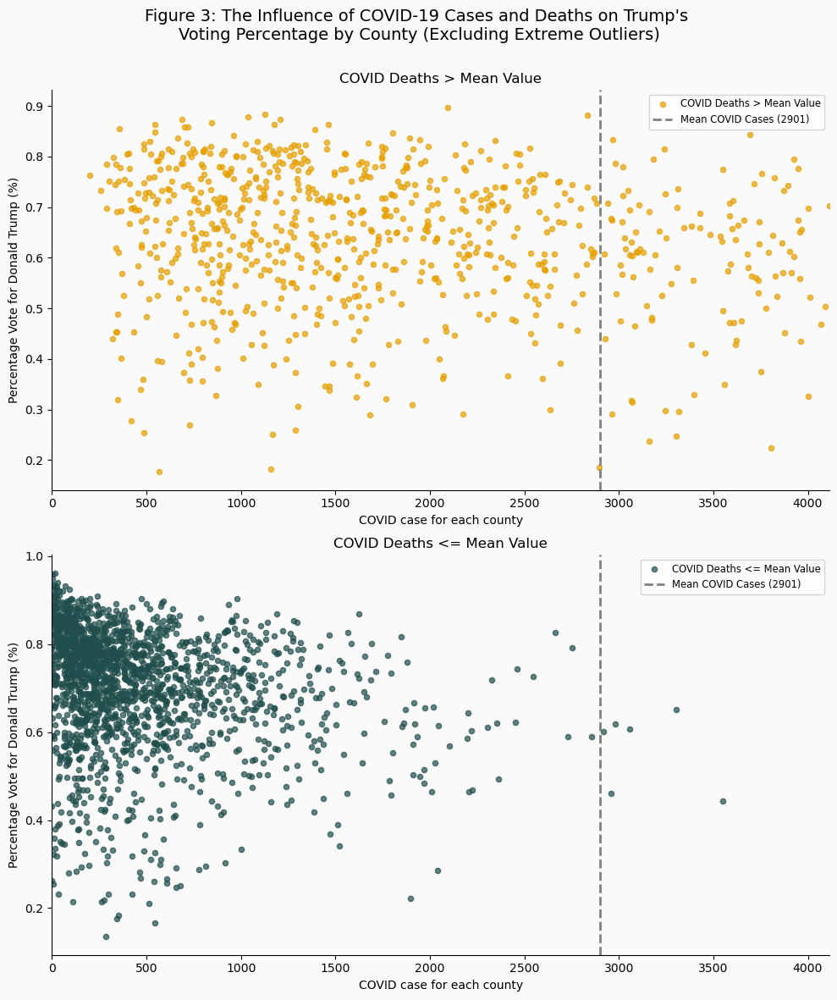

In [5]:
# Modified function to add individual legends for each subplot
def create_subplot(ax, data, title, color, label_text):
    """
    The helper function to create each subplot
    """
    ax.scatter(data['cases'], data['percentage20_Donald_Trump'], 
               c=color, s=20, alpha=0.7, label=label_text)
    ax.set_xlabel('COVID case for each county')
    ax.set_ylabel('Percentage Vote for Donald Trump (%)')
    ax.set_title(title)
    
    # Remove top and right axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Setting axis background color
    ax.set_facecolor(bgcolor)
    
    # Adding vertical line with a label
    line = ax.axvline(x=2901, color='grey', linestyle='--', linewidth=2, alpha=1)
    
    # Adjusting the legend
    handles, labels = ax.get_legend_handles_labels()
    handles.append(line)
    labels.append('Mean COVID Cases (2901)')
    ax.legend(handles=handles, labels=labels, loc='upper right', fontsize="small")

# Define the mean deaths
mean_deaths = filtered_data1['deaths'].mean()

# Split the data into two groups based on 'deaths' being higher or lower than the mean
higher_than_mean = filtered_data1[filtered_data1['deaths'] > mean_deaths]
lower_than_mean = filtered_data1[filtered_data1['deaths'] <= mean_deaths]

bgcolor = (250/255, 250/255, 250/255)
# Create the combined plot with subplots arranged vertically
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), facecolor=bgcolor)

create_subplot(ax1, higher_than_mean, "COVID Deaths > Mean Value", '#E69F00', "COVID Deaths > Mean Value")
create_subplot(ax2, lower_than_mean, "COVID Deaths <= Mean Value", '#204e4c', "COVID Deaths <= Mean Value")

# Set common title for the plots
fig.suptitle("Figure 3: The Influence of COVID-19 Cases and Deaths on Trump's \nVoting Percentage by County (Excluding Extreme Outliers)", fontsize=14)

# Ensure the x-axes have the same scale
ax1.set_xlim([0, max(filtered_data1['cases'])])
ax2.set_xlim([0, max(filtered_data1['cases'])])

plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Adjust title spacing
plt.show()

Figure 3 illustrates the relationship between the percentage of votes cast for Donald Trump and COVID cases across all counties. The colors differentiate counties based on their COVID death counts relative to the average—dark teal for those below the mean and orange for those surpassing it. A vertical line demarcates the average number of COVID cases, pegged at 2,901. 

On the scatterplot, it suggests that higher COVID cases correspond to lower percentages of votes for Trump, especially in the counties having COVID deaths less than the mean value. In addition, we can not observe a clear trend of voting pattern for the counties whose death number is higher than the mean value. Moreover, it is unsurprising that the most counties with COVID cases larger than the mean level have a death level larger than the mean level.

From Figure 3, we can observe a correlation between voting patterns and COVID. It would be compelling to understand how these patterns shift when considering economic factors. I will show this in the following figure.

Text(0.5, 0.95, "Figure 4: Impact of COVID on Trump's Vote Percentage through Unemployment and Income Dynamics by county")

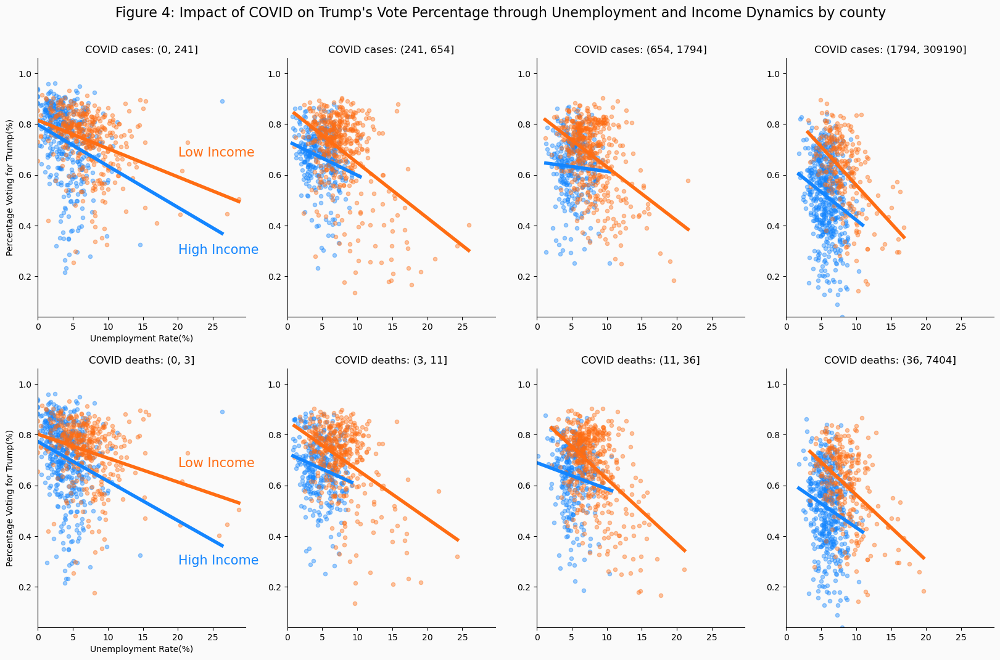

In [6]:
df['cases_category'] = pd.qcut(df['cases'], 4)
df['deaths_category'] = pd.qcut(df['deaths'], 4)

median_income = df['IncomePerCap'].median()
df['income_group'] = ["High" if x > median_income else "Low" for x in df['IncomePerCap']]

colors = {"High": "#1385ff", "Low": "#ff6d13"}

def single_scatter_plot(df, category, income_group, ax, color, cases_cat = True):
    """ 
    This function creates a single cases category's and income level's
    unemployment to percentage20_Donald_Trump plot.
    """
    if cases_cat:
        _df = df[(df['cases_category'] == category) & (df['income_group'] == income_group)]
    else:
        _df = df[(df['deaths_category'] == category) & (df['income_group'] == income_group)]
    _df.plot(kind="scatter", x="Unemployment", y="percentage20_Donald_Trump", ax=ax, color=color, alpha = 0.4)

    lr = LinearRegression()
    X = _df["Unemployment"].dropna().values.reshape(-1, 1)
    y = _df["percentage20_Donald_Trump"].dropna().values.reshape(-1, 1)
    lr.fit(X, y)

    x = np.linspace(min(_df["Unemployment"]), max(_df["Unemployment"])).reshape(-1, 1)
    y_pred = lr.predict(x)
    ax.plot(x, y_pred, color=color, linewidth=4)

    return ax

# Create initial plot
fig, ax = plt.subplots(2, 4, figsize=(20, 12))


# For Cases:
for (i, cases_cat) in enumerate(df.cases_category.cat.categories):
    lower_bound = int(cases_cat.left)
    upper_bound = int(cases_cat.right)
    single_scatter_plot(df, cases_cat, "High", ax[0, i], colors["High"], True)  
    single_scatter_plot(df, cases_cat, "Low", ax[0, i], colors["Low"], True)   
    ax[0, i].set_title(f"COVID cases: ({lower_bound}, {upper_bound}]")       

# For Deaths:
for (i, deaths_cat) in enumerate(df.deaths_category.cat.categories):
    lower_bound = int(deaths_cat.left)
    upper_bound = int(deaths_cat.right)
    single_scatter_plot(df, deaths_cat, "High", ax[1, i], colors["High"], False)  # Change ax[i] to ax[1, i]
    single_scatter_plot(df, deaths_cat, "Low", ax[1, i], colors["Low"], False)   # Change ax[i] to ax[1, i]
    ax[1, i].set_title(f"COVID deaths: ({lower_bound}, {upper_bound}]")  

bgcolor = (250/255, 250/255, 250/255)
fig.set_facecolor(bgcolor)
for i, _ax in enumerate(ax.flatten()):  # Flatten the array for iteration
    if i == 0 or i == 4:
        _ax.set_xlabel("Unemployment Rate(%)")
        _ax.set_ylabel("Percentage Voting for Trump(%)")
    else:
        _ax.set_xlabel("")
        _ax.set_ylabel("")

    _ax.spines['right'].set_visible(False)
    _ax.spines['top'].set_visible(False)
    _ax.set_facecolor(bgcolor)

    # Setting bounds based on data
    _ax.set_xlim([min(df["Unemployment"]), max(df["Unemployment"]) + 1])
    _ax.set_ylim([min(df["percentage20_Donald_Trump"]), max(df["percentage20_Donald_Trump"]) + 0.1])

# Use ax[0, 0] instead of ax[0] to annotate on the first axis
fontsize_val = 15  # You can adjust this value as needed

ax[0, 0].annotate("High Income", (max(df["Unemployment"])*0.7, max(df["percentage20_Donald_Trump"])*0.3), color=colors["High"], fontsize=fontsize_val)
ax[0, 0].annotate("Low Income", (max(df["Unemployment"])*0.7, max(df["percentage20_Donald_Trump"])*0.7), color=colors["Low"], fontsize=fontsize_val)
ax[0, 0].set_zorder(1)

ax[1, 0].annotate("High Income", (max(df["Unemployment"])*0.7, max(df["percentage20_Donald_Trump"])*0.3), color=colors["High"], fontsize=fontsize_val)
ax[1, 0].annotate("Low Income", (max(df["Unemployment"])*0.7, max(df["percentage20_Donald_Trump"])*0.7), color=colors["Low"], fontsize=fontsize_val)
ax[1, 0].set_zorder(1)

fig.suptitle("Figure 4: Impact of COVID on Trump's Vote Percentage through Unemployment and Income Dynamics by county", fontsize=16, y=0.95)

Figure 4 illustrates how the number of COVID cases or deaths in each county influences the percentage of votes for Donald Trump across varying unemployment rates. There are four subplots for the "cases" and "deaths," with each subplot denoting a quartile of counties based on their COVID-19 cases or deaths. I've also divided the income per capita into "High Income" and "Low Income," determined by whether they exceed or fall the median income per capita. The two groups are represented by red and blue, respectively. I also plot the linear regression lines for each income group within every subplot to better observe the potential trends.

From the graph, we can see that as the number of COVID cases and deaths increases, the percentage of votes for Donald Trump decreases slightly, and this pattern is more evident for the high-income group. For instance, in counties with COVID cases ranging from 0 to 241, when the unemployment rate is at 5%, the voting percentage stands at approximately 75% for both income groups. Yet, in counties with over 1794 cases, the voting percentages decrease to roughly 65% for high-income and 50% for low-income groups. The "deaths" shows a similar trend. 

In addition, the decline in voting percentage with an increase in deaths is slightly higher than with an uptick in case numbers. Moreover, the only county where almost no votes were cast for Donald Trump falls within the fourth quartile for both COVID cases and deaths. This could suggest a possible link between the virus's severity in a county and its voting patterns.

Furthermore, it is interesting that with the increase in cases and deaths, the points (counties) are moving away from the y-axis, meaning that the counties with a lower unemployment rate are less likely to have significant COVID cases or deaths.

# Project Two

## The Message

The visualizations from the Project One shows the correlations between percentage vote for Donald Trump and COVID cases and deaths. They also present how the voting patterns varies with unemployment rate and income per capita under different COVID cases and deaths. Use the information from Project One, we may conclude the answers for our research question, which is:

Trump's approach to COVID-19 seems to play an important role in his 2020 Federal Election voting patterns. His inadequacies in addressing the pandemic led to significant COVID-19 cases and deaths across counties. In addition, counties with higher COVID-19 cases/deaths tended to lean away from supporting him. Moreover, there's a noticeable inverse relation between unemployment rates and Trump's vote percentage. Besides, wealthier counties, which are more concerned about public health issues, appear to vote for Trump less than less affluent counties. However, unlike the richer counties, it seems that the COVID do not stimulate poorer people not to vote for Donald Trump.

With this message in the mind, I will visualize how did the COVID impact Donald voting patterns in 2020, comparing to the election results of 2016 US Federal Election. In addition, I will also show the relatioship between the percentage vote and income per capita level.

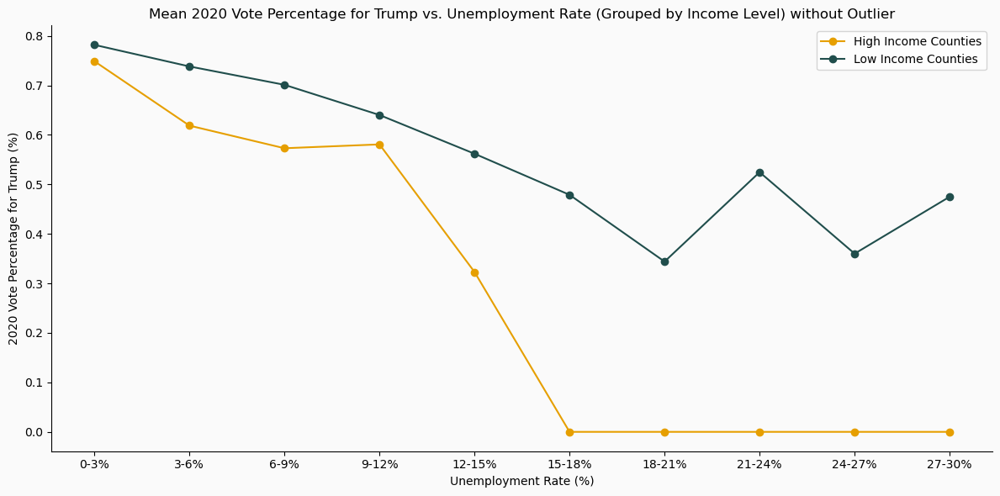

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Divide the counties into "low income" and "high income" based on the median
median_income = df['IncomePerCap'].median()
low_income_df = df[df['IncomePerCap'] <= median_income]
high_income_df = df[df['IncomePerCap'] > median_income]

# Create 10 intervals for the unemployment rate
intervals = [(i, i+3) for i in range(0, 30, 3)]

# Calculate mean percentage vote for both groups across each interval
low_income_means = []
high_income_means_full = []

for start, end in intervals:
    low_income_mean = low_income_df[(low_income_df['Unemployment'] >= start) & 
                                    (low_income_df['Unemployment'] < end)]['percentage20_Donald_Trump'].mean()
    high_income_mean = high_income_df[(high_income_df['Unemployment'] >= start) & 
                                      (high_income_df['Unemployment'] < end)]['percentage20_Donald_Trump'].mean()
    
    low_income_means.append(low_income_mean)
    high_income_means_full.append(high_income_mean if not pd.isna(high_income_mean) else 0)

# Replace the outlier value (89.1%) with 0 in high income means
high_income_means_full = [value if value != 0.891 else 0 for value in high_income_means_full]

# Plotting
x_values = [(start + end) / 2 for start, end in intervals]

# Define bgcolor
bgcolor = (250/255, 250/255, 250/255)

# Plotting with dots on each data point and the specified background color
plt.figure(figsize=(12, 6), facecolor=bgcolor)
plt.plot(x_values, high_income_means_full, label='High Income Counties', color='#E69F00', marker='o', linestyle='-')
plt.plot(x_values, low_income_means, label='Low Income Counties', color='#204e4c', marker='o', linestyle='-')
plt.xlabel('Unemployment Rate (%)')
plt.ylabel('2020 Vote Percentage for Trump (%)')
plt.title("Mean 2020 Vote Percentage for Trump vs. Unemployment Rate (Grouped by Income Level) without Outlier")
plt.xticks(ticks=x_values, labels=["{}-{}%".format(start, end) for start, end in intervals])
plt.legend()

ax = plt.gca()  # get the current axis
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_facecolor(bgcolor)

plt.tight_layout()
plt.show()


Figure 5 illustrates the relationship between the percentage of votes for Trump and unemployment rates in counties with high and low income levels. There is one clear trend that the percentage vote for Trump in 2020 decreases as unemployment increases no matter the counties is rich or not. Additionally, it's evident that wealthier counties generally have lower unemployment rates compared to the less affluent counties.

With this trend in mind, we can delve deeper into how specific income groups correlate with vote for Trump. This will be on the upcoming graph.

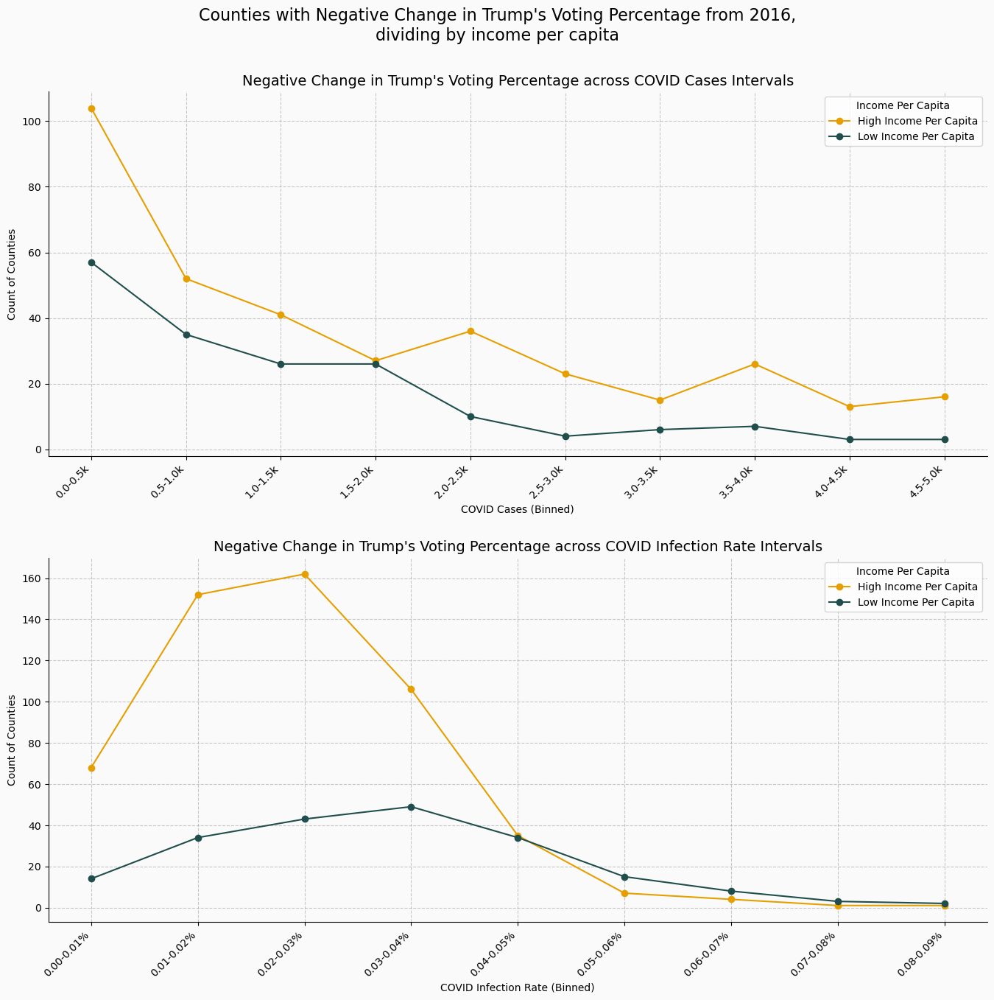

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is already loaded

# Compute the vote change and infection rate columns
df["vote_change"] = df["percentage20_Donald_Trump"] - df["percentage16_Donald_Trump"]
df["infection_rate"] = df["cases"] / df["TotalPop"]

# Filtering data for negative vote change and creating an explicit copy
negative_change_data = df[df['vote_change'] < 0].copy()
filtered_data = df[df['cases'] < 1794 + 1.5*(1794-241)]  # Filtering based on COVID cases

def plot_data(ax, x_values, y_values_high, y_values_low, xlabel, title):
    """
    The helper function to plot the graph using the given data
    """
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    ax.plot(x_values, y_values_high, label='High Income Per Capita', marker='o', color='#E69F00')
    ax.plot(x_values, y_values_low, label='Low Income Per Capita', marker='o', color='#204e4c')
    
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel)
    ax.set_ylabel('Count of Counties')
    ax.legend(title='Income Per Capita')
    ax.grid(linestyle='--', alpha=0.7)
    ax.set_xticks(x_values)
    ax.set_xticklabels(x_values, rotation=45, ha='right')

# Binning and processing for COVID cases
adjusted_bins_cases = list(range(0, 5001, 500))
adjusted_labels_cases = [f"{i/1000}-{(i+500)/1000}k" for i in range(0, 4501, 500)]
negative_change_data['cases_bin'] = pd.cut(negative_change_data['cases'], bins=adjusted_bins_cases, labels=adjusted_labels_cases, right=False)
high_counts = negative_change_data[negative_change_data['IncomePerCap'] > filtered_data['IncomePerCap'].mean()]['cases_bin'].value_counts().sort_index()
low_counts = negative_change_data[negative_change_data['IncomePerCap'] <= filtered_data['IncomePerCap'].mean()]['cases_bin'].value_counts().sort_index()

# Binning and processing for infection rate
infection_rate_bins = [i/1000 for i in range(0, 100, 10)]  # 0% to 0.06% in increments of 0.01%
infection_rate_labels = [f"{infection_rate_bins[i]:.2f}-{infection_rate_bins[i+1]:.2f}%" for i in range(len(infection_rate_bins)-1)]
negative_change_data['infection_rate_bin'] = pd.cut(negative_change_data['infection_rate'], bins=infection_rate_bins, labels=infection_rate_labels, right=False)
high_infection_counts = negative_change_data[negative_change_data['IncomePerCap'] > filtered_data['IncomePerCap'].mean()]['infection_rate_bin'].value_counts().sort_index()
low_infection_counts = negative_change_data[negative_change_data['IncomePerCap'] <= filtered_data['IncomePerCap'].mean()]['infection_rate_bin'].value_counts().sort_index()

# Plotting combined graphs
bgcolor = (250/255, 250/255, 250/255)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 14), facecolor=bgcolor)
ax1.set_facecolor(bgcolor)
ax2.set_facecolor(bgcolor)

plot_data(ax1, adjusted_labels_cases, high_counts.values, low_counts.values, 'COVID Cases (Binned)', "Negative Change in Trump's Voting Percentage across COVID Cases Intervals")
plot_data(ax2, infection_rate_labels, high_infection_counts.values, low_infection_counts.values, 'COVID Infection Rate (Binned)', "Negative Change in Trump's Voting Percentage across COVID Infection Rate Intervals")

fig.suptitle("Counties with Negative Change in Trump's Voting Percentage from 2016,\ndividing by income per capita", fontsize=16, y=0.98)
plt.tight_layout(pad=2.5)
plt.show()


Figure 6 shows the number of counties with a negative change of voting for Trump across different intervals of COVID cases and infection rates. Besides, the two lines from each graph represent the high and low-income per capita counties.

In either plot, we can find a pattern that the number of counties with a negative voting shift for wealthier counties is higher or approximately the same for the poorer counties. This pattern is more evident in the second graph, where the more affluent countries had 150 more counties, which reduced their support for Trump, compared to the poorer countries. Even though there were slightly more counties with negative support for Trump if the infection rate was 0.05% or higher, the number of counties with a negative change of percentage vote in wealthy counties is much larger than the poor counties. In addition, there were always more countries voting negatively for Trump in rich countries across all intervals of COVID cases.

Combining the patterns from both plots, one might infer that wealthier counties appear more responsive to public health situations. Their voting tendencies seem inversely proportional to the rise in COVID-19 cases or infection rate, potentially reflecting their perception of the administration's handling of the pandemic. However, lower-income counties appear less influenced by the pandemic's progression. Even though the number of countries voting negatively for Trump is not zero, it is still relatively small compared to rich countries. This suggests that different income groups may have other priorities or perceptions of the crisis.

To visualize the above information for each county across the US, I will draw some maps to illustrate my main message better.

## Maps and Interpretations

In [9]:
import geopandas as gpd
from shapely.geometry import Point
import us

df["Coordinates"] = list(zip(df.long, df.lat))
df["Coordinates"] = df["Coordinates"].apply(Point)
gdf = gpd.GeoDataFrame(df, geometry="Coordinates")

state_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2016/shp/cb_2016_us_state_5m.zip")
county_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2016/shp/cb_2016_us_county_5m.zip")

# Define the bounding box
bbox = {
    "xmin": -130,
    "xmax": -65,
    "ymin": 24,
    "ymax": 50
}

# Use the bounding box to filter out extraneous data
state_df = state_df.cx[bbox["xmin"]:bbox["xmax"], bbox["ymin"]:bbox["ymax"]]
county_df = county_df.cx[bbox["xmin"]:bbox["xmax"], bbox["ymin"]:bbox["ymax"]]

# Clean the two datasets
df["county"] = df["county"].str.title()
df["county"] = df["county"].str.strip()
county_df["NAME"] = county_df["NAME"].str.title()
county_df["NAME"] = county_df["NAME"].str.strip()

def fips_to_abbr(fips_code):
    """
    Helper function to find the abbreviations of each state
    """
    state = us.states.lookup(str(fips_code))
    if state:
        return state.abbr
    return None

county_df['state'] = county_df['STATEFP'].apply(fips_to_abbr)
county_df['county'] = county_df['NAME']

# Preprocessing steps for COVID-19 data
df["deaths_rate"] = df["deaths"] / df["TotalPop"]
df["vote_change"] = df["percentage20_Donald_Trump"] - df["percentage16_Donald_Trump"]

dt_us = county_df.merge(df, on=['county', 'state'], how='inner')

In [10]:
import matplotlib.patheffects as path_effects

# Define some esential functions
def plot_map(df, ax, data_column, cmap, vmin, vmax, legend_kwds):
    """
    Helper function to plot the map based on provided settings.
    """
    df.plot(
        ax=ax, 
        edgecolor='black', 
        linewidth=0.5,
        column=data_column, 
        legend=True, 
        cmap=cmap,
        vmin=vmin, 
        vmax=vmax,
        legend_kwds=legend_kwds
    )
    # Plotting the boundaries of the states (excluding Hawaii and Alaska)
    state_df.query("NAME != 'Hawaii' and NAME != 'Alaska'").boundary.plot(ax=ax, color="black", linewidth=2)
    
def annotate_plot(ax):
    """
    The helper function to annotate the name of each state on the map
    """
    state_df_projected = state_df.to_crs('EPSG:5070')
    centroids = state_df_projected.geometry.centroid
    centroids_original_crs = centroids.to_crs(state_df.crs)
    for x, y, label in zip(centroids_original_crs.x, centroids_original_crs.y, state_df['STUSPS']):
        text = ax.annotate(label, xy=(x, y), xytext=(3,3), textcoords="offset points", 
                    fontsize=18, ha='center', color='black', weight='bold')
        text.set_path_effects([path_effects.Stroke(linewidth=1, foreground='white'),
                               path_effects.Normal()])
        
def generate_plots(df, axs, data_columns, cmaps, vmins, vmaxs, legend_labels, titles, main_title):
    """
    The helper function to generate the plots
    """
    for i, ax in enumerate(axs):
        # Using the plot_map function
        legend_kwds = {'label': legend_labels[i]}
        plot_map(df, ax, data_columns[i], cmaps[i], vmins[i], vmaxs[i], legend_kwds)
        
        # Setting titles
        ax.set_title(titles[i], fontsize=20)
        ax.axis('off')

        # Annotating the plots with state abbreviations
        annotate_plot(ax)
        
    # Set a common title for the entire figure
    fig.suptitle(main_title, fontsize=24, y=1.03)
    plt.tight_layout()
    plt.show()

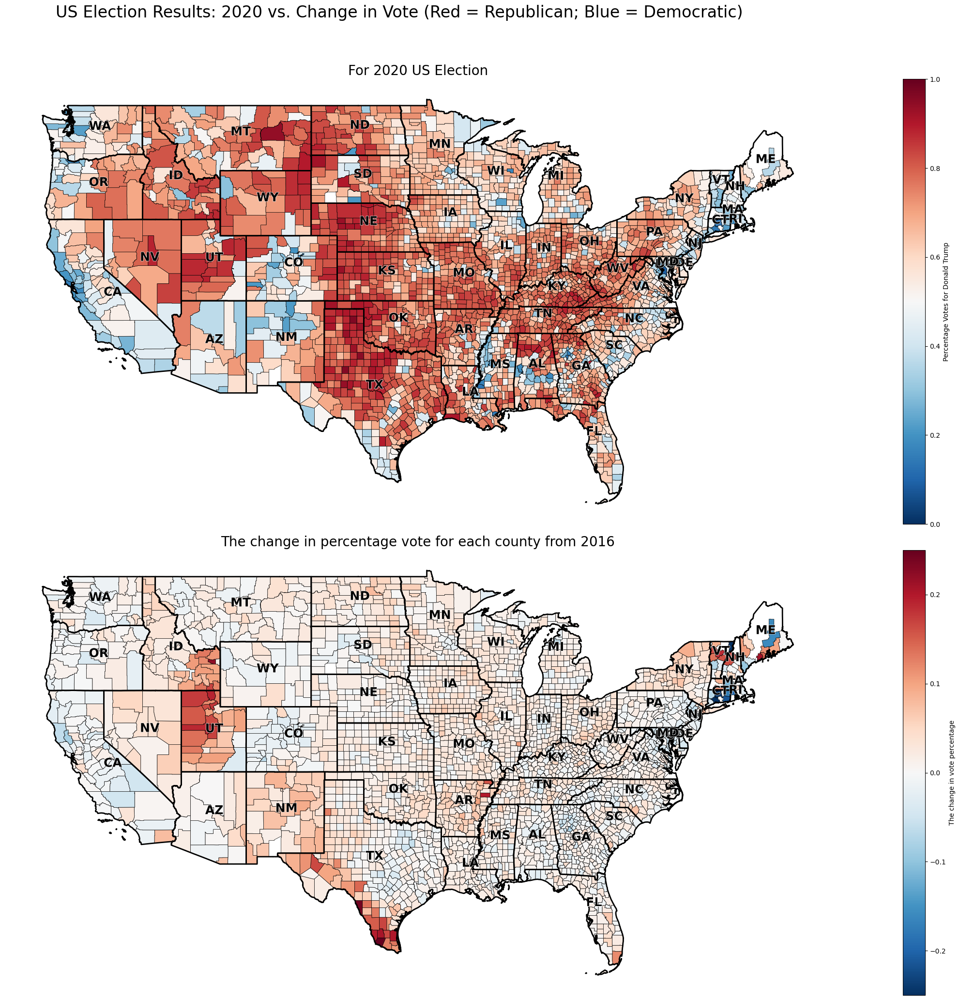

In [11]:
data_columns = ['percentage20_Donald_Trump', 'vote_change']
cmaps = ['RdBu_r', 'RdBu_r']
vmins = [0, -0.25]
vmaxs = [1, 0.25]
legend_labels = ["Percentage Votes for Donald Trump", "The change in vote percentage"]
titles = ["For 2020 US Election", "The change in percentage vote for each county from 2016"]
main_title = "US Election Results: 2020 vs. Change in Vote (Red = Republican; Blue = Democratic)"

fig, axs = plt.subplots(2, 1, figsize=(30, 20))
generate_plots(dt_us, axs, data_columns, cmaps, vmins, vmaxs, legend_labels, titles, main_title)

The Figure 7 displays the results of the 2020 US Election and the change in percentage vote from 2016 to 2020 at the county level. Vote percentages are illustrated through a diverging color scale in both maps. A deeper red indicates a higher percentage of votes for Donald Trump (Republican), while a deeper blue shows a stronger preference for Joe Biden (Democrat). Areas in white represent counties where the vote split between Republicans and Democrats was roughly equal.

From the first map, it's evident that counties in the central and mid-eastern states of the US such as NE and MO showed a preference for Donald Trump. Conversely, the more urbanized states on the coasts such as CA and ME leaned towards the Democratic Party. However, from the second, we can observe that except the states of UT, NM and TX on the middle-west, the other states who vote for Donald Trump in 2020 have a relative bright colours and many of them even shows a bright blue. By contrast, those states who do not vote for Donald Trump in 2020 still shows a blue color (no matter bright or deep) such as CA, WA and CT. 

This indicates that even though the counties still vote for Donald Trump, their support remains constant or even decreases compared to 2016. The most obvious state will be WY where most counties maintain and some even reduce their support for Donald Trump. In addition, the states who do not vote for Donald Trump in 2016 seems to increase their resolve, meaning that there are less people voting for Donald Trump compared to 2016. The most evident state will be CA where above 90% counties continue to not vote for Donald Trump. Furthermore, it is interesting that some states became more neatural. The most obvious state would be TX. Even though the south-west counties votes for Joe Biden, but there support for him reduces. However, the counties on the east votes for Donald Trump but also reduces their support. 

The abpve two maps gives us the voting patterns for 2016 and 2020. The potential reasons behind the decresing votes for Donald Trump is COVID. I will plot the map based on the COVID cases and deaths on next two plots.

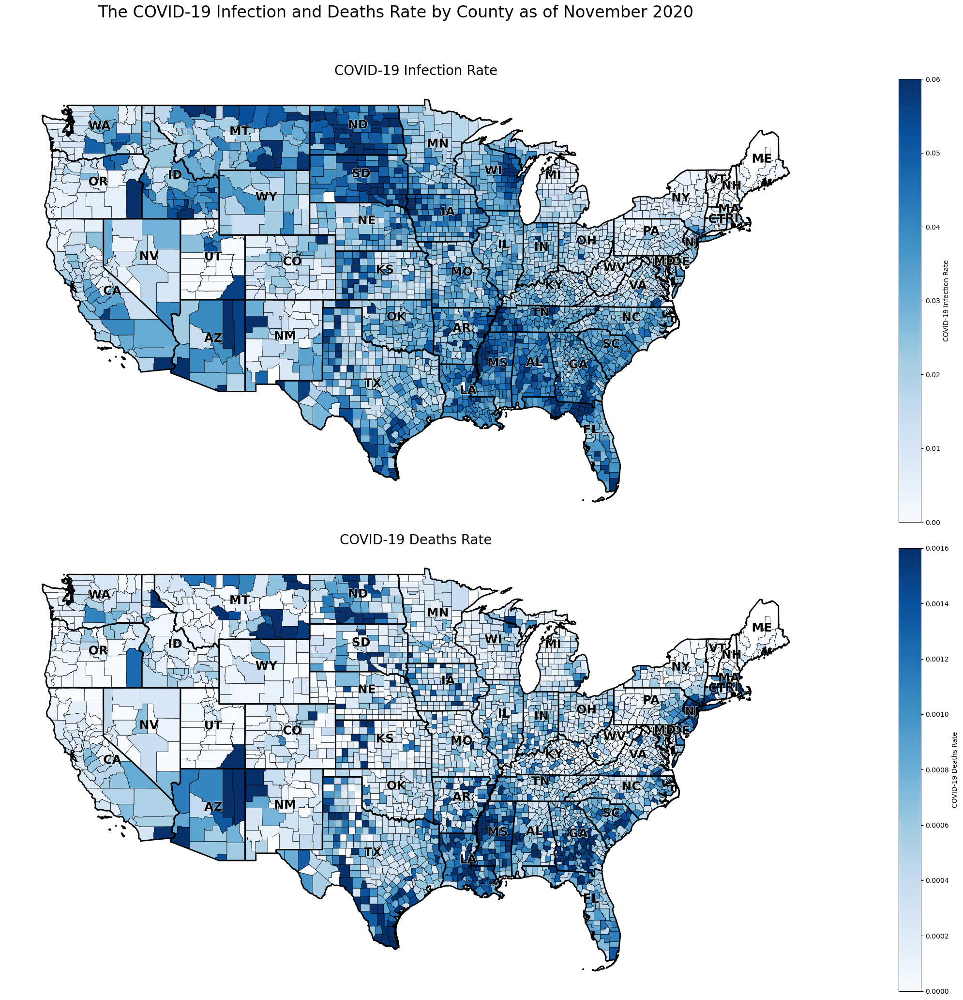

In [12]:
data_columns = ['infection_rate', 'deaths_rate']
cmaps = ['Blues', 'Blues']
vmins = [0, 0]
vmaxs = [0.06, 0.0016]
legend_labels = ["COVID-19 Infection Rate", "COVID-19 Deaths Rate"]
titles = ["COVID-19 Infection Rate", "COVID-19 Deaths Rate"]
main_title = "The COVID-19 Infection and Deaths Rate by County as of November 2020"

fig, axs = plt.subplots(2, 1, figsize=(30, 20))
generate_plots(dt_us, axs, data_columns, cmaps, vmins, vmaxs, legend_labels, titles, main_title)

Figure 8 displays the COVID-19 infection and death rates for each county. A deeper shade of blue indicates a higher infection and death rate in that county. To ensure clarity and avoid distortion from extreme values, the color scale is set from 0 to 0.05 for infection rates, and from 0 to 0.001 for death rates. Consequently, a county with the deepest blue hue may have an infection rate exceeding 0.05 or a death rate surpassing 0.001.

From the first map, it's evident that the infection rate is particularly high in the northern and southern regions of the US, notably in states like ND and LA. Conversely, states situated in the central region, such as UT, WY, and CO, have comparatively lower infection rates. A similar pattern is observed for death rates, but southern states like LA have shown a more pronounced severity. In LA, nearly every county has a death rate over 0.0001. 

Comparing Figures 6 and 7, there seems to be an inverse correlation between a county's percentage of votes and its infection and death rates. This observation aligns with our findings from Project One. Like what Lockman; & Blendon [4] suggested: Republicans in rural areas typically have limited trust in the government's capability to manage programs and are strongly against increased government intervention in health care. Counties with lower infection and death rates appear more inclined to support Trump and vice versa. For instance, the maps in Figure 7 show that UT, overall, has lower infection and death rates than most other states. Most counties in UT reported roughly a 20% increase in their votes for Trump. However, there are notable exceptions, such as certain southern counties in TX and LA. Despite experiencing high infection and death rates, these counties showed stronger support for Trump.

Anomalies in Texas and Los Angeles have raised questions about the economic health of those counties. Refer to our message, if these counties have a relative low income per capita, then it might be easier to understand their continued support for Trump. To further illustrate the impact of economic indicators on voting behavior, I will provide two additional maps.

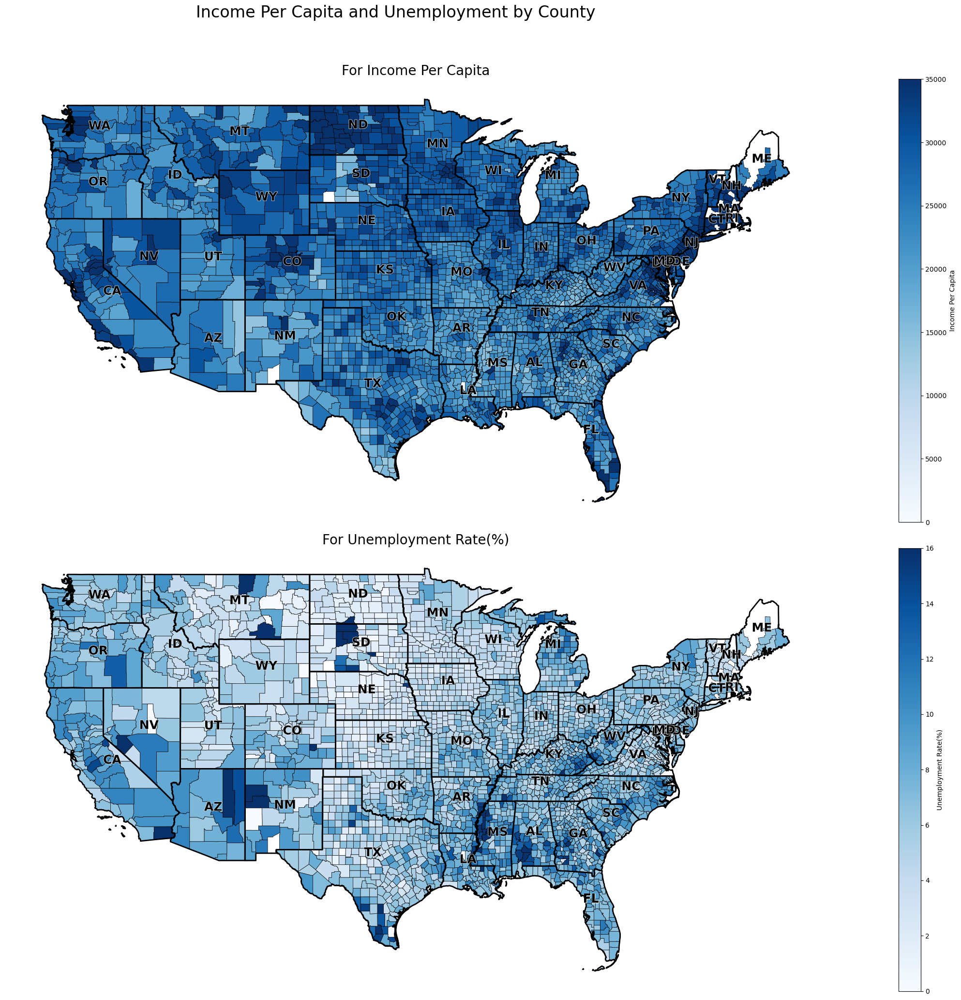

In [13]:
data_columns = ['IncomePerCap', 'Unemployment']
cmaps = ['Blues', 'Blues']
vmins = [0, 0]
vmaxs = [35000, 16]
legend_labels = ["Income Per Capita", "Unemployment Rate(%)"]
titles = ["For Income Per Capita", "For Unemployment Rate(%)"]
main_title = "Income Per Capita and Unemployment by County"

fig, axs = plt.subplots(2, 1, figsize=(30, 20))
generate_plots(dt_us, axs, data_columns, cmaps, vmins, vmaxs, legend_labels, titles, main_title)

Figure 9 illustrates the distribution of income per capita and unemployment rates across all counties. A deeper shade of green indicates a higher income per capita or a heightened unemployment rate. For clarity in visualization, the thresholds have been set at $38,000 for income per capita and 12% for the unemployment rate.

From the first map, it's evident that wealthier counties are predominantly situated on the western and eastern coasts of the US. Among inland states, ND stands out with a notably higher average income per capita. When examining unemployment rates, specific counties in SD, AZ, NM, and TX display high rates. However, there was not an obvious pattern for the other states. In addition, counties with lower income per capita often coincide with higher unemployment rates. For instance, counties in SD with an income per capita of about $10,000 exhibit unemployment rates exceeding 16%.

Back to our previous question regarding the strong support for Trump in areas like LA and southern TX, despite high infection or death rates. The Figure 9 providse some clarity. These regions typically have lower income levels and relatively high unemployment rates. This observation supports the idea that Trump's appeal was stronger in lower-income counties, where concerns about public health might not be primary.

By far, we already draw six maps and one heat-map to examine the distribution of both dependent (Y) and independent (X) variables for US counties. From the observations on maps, our message still hold. The increase in COVID cases or death does not necessarily decrease their support for Donald Trump. The last heat-map matches the results from previous map, which we are more convinced that Donald Trump lost support from the richer people. And the key factor behind this is the COVID.

# Final Project

## Merging Data

I will merge the data from ACS using data-scraping on API, which are the ACS 5-year estimates in 2016 and 2020 [6].

In [14]:
import pandas as pd
import requests

def scrape_census_data(year, group_code):
    """
    Scrape data from the Census API based on the provided year and group code.
    
    Args:
    - year (int): The year for which data is required.
    - group_code (str): The group code specifying the type of data.
    
    Returns:
    - pd.DataFrame: A dataframe containing the fetched data.
    """
    
    base_url = f"https://api.census.gov/data/{year}/acs/acs5/profile"
    params = {
        "get": f"group({group_code})",
        "for": "county:*"
    }
    
    response = requests.get(base_url, params=params)
    data = response.json()
    
    return pd.DataFrame(data[1:], columns=data[0])

# Fetching the data using the function
income16 = scrape_census_data(2016, "DP03")
income20 = scrape_census_data(2020, "DP03")
demographic16 = scrape_census_data(2016, "DP05")
demographic20 = scrape_census_data(2020, "DP05")

In [15]:
import us

def get_state_abbreviation(state_name):
    """
    Convert full state name to its abbreviation.
    """
    state = us.states.lookup(state_name)
    if state:
        return state.abbr
    return None

def extract_county(name):
    """
    Extract the county name from a 'County, State' formatted string.
    """
    if isinstance(name, str) and ',' in name:
        return name.split(',')[0].replace(' County', '').strip()
    return None
    
def extract_state(name):
    """
    Extract the state abbreviation from a 'County, State' formatted string.
    """
    if isinstance(name, str) and ',' in name:
        return get_state_abbreviation(name.split(',')[1].strip())
    return None

def data_cleaning(df, rename_dict):
    """
    Clean and rename columns in a DataFrame.
    """
    df = df.drop(0).reset_index(drop=True)
    df['county'] = df['NAME'].apply(extract_county)
    df['state'] = df['NAME'].apply(extract_state)
    columns_to_select = ['county', 'state'] + list(rename_dict.keys())
    selected_df = df[columns_to_select]
    renamed_df = selected_df.rename(columns=rename_dict)
    return renamed_df.sort_values(by=['state', 'county']).reset_index(drop=True)


In [16]:
in16dict = {"DP03_0088E": "IncomePerCap16",
           "DP03_0009PE": "Unemployment16"}
in20dict = {"DP03_0088E": "IncomePerCap20",
           "DP03_0009PE": "Unemployment20"}
de16dict = {"DP05_0001E": "TotalPop16",
            "DP05_0072PE": "percentage16_White",
            "DP05_0073PE": "percentage16_Black",
            "DP05_0075PE": "percentage16_Asian",
            "DP05_0003PE": "percentage16_Female"}
de20dict = {"DP05_0001E": "TotalPop20",
            "DP05_0077PE": "percentage20_White",
            "DP05_0078PE": "percentage20_Black",
            "DP05_0080PE": "percentage20_Asian",
            "DP05_0003PE": "percentage20_Female"}

# Assuming you've loaded your data into 'income16'
income16_clean = data_cleaning(income16, in16dict)
income20_clean = data_cleaning(income20, in20dict)
demographic16_clean = data_cleaning(demographic16, de16dict)
demographic20_clean = data_cleaning(demographic20, de20dict)

In [17]:
# Merge the above four data to our original data
df_merged = dt_us.merge(income16_clean, on=['county', 'state'], how='inner')
df_merged = df_merged.merge(income20_clean, on=['county', 'state'], how='inner')
df_merged = df_merged.merge(demographic16_clean, on=['county', 'state'], how='inner')
df_merged = df_merged.merge(demographic20_clean, on=['county', 'state'], how='inner')

# Convert the object columns to numeric, setting errors='coerce' to turn problematic entries into NaNs
columns_to_convert = ["IncomePerCap16", "Unemployment16", "IncomePerCap20", "Unemployment20", 
                      "TotalPop16", "percentage16_White", "percentage16_Black", "percentage16_Asian", "percentage16_Female", 
                      "TotalPop20", "percentage20_White", "percentage20_Black", "percentage20_Asian", "percentage20_Female"]

for col in columns_to_convert:
    df_merged[col] = pd.to_numeric(df_merged[col], errors='coerce')

df_merged["percentage_change_IncomePerCap"] = (
    df_merged["IncomePerCap20"] - df_merged["IncomePerCap16"]
) / df_merged["IncomePerCap16"]

# Calculate percentage change in Unemployment
df_merged['Unemployment16'] = df_merged['Unemployment16']/100
df_merged['Unemployment20'] = df_merged['Unemployment20']/100
df_merged["Unemployment_change"] = df_merged["Unemployment20"] - df_merged["Unemployment16"]

# Calculate change in White percentage
df_merged["percentage16_White"] = df_merged["percentage16_White"]/100
df_merged["percentage20_White"] = df_merged["percentage20_White"]/100
df_merged["percentage16_Black"] = df_merged["percentage16_Black"]/100
df_merged["percentage20_Black"] = df_merged["percentage20_Black"]/100
df_merged["percentage16_Female"] = df_merged["percentage16_Female"]/100
df_merged["percentage20_Female"] = df_merged["percentage20_Female"]/100

df_merged["White_change"] = df_merged["percentage20_White"] - df_merged["percentage16_White"]
df_merged["Black_change"] = df_merged["percentage20_Black"] - df_merged["percentage16_Black"]
df_merged["Female_change"] = df_merged["percentage20_Female"] - df_merged["percentage16_Female"]

df_merged_geom = df_merged
df_merged = df_merged.iloc[:, 10:]
df_merged['win_2016'] = (df_merged['percentage16_Donald_Trump'] > 0.5).astype(int)

**Table 3.1.1:** The summary statistics for change of percentage vote for Trump from 2016

|           Name                | Type  |  count |   mean   |    std   |   min   |   25%   |   50%   |   75%   |   max   |
|:------------------------------|------:|-------:|--------:|--------:|-------:|-------:|-------:|-------:|-------:|
| Vote Change | Float | 2927 | 0.0157 | 0.0328 | -0.30 | 0.00 | 0.01 | 0.03 | 0.28 |


Table 3.1.1 summarise the vote change for Trump from 2016, we can observe that the mean and median change are both around 0. Howeverm there is a about 0.6 difference between the maximum and the minimum change of vote.

**Table 3.1.2:** The summary statistics for change of percentage vote based on Income Per Capita

| Income Group     |  count |   mean  |    std   |   min   |   25%   |   50%   |   75%   |   max   |
|:-----------------|-------:|--------:|--------:|-------:|-------:|-------:|-------:|-------:|
| Lower Income     | 1464   | 0.0232  | 0.0321  | -0.30  | 0.01   | 0.02   | 0.03   | 0.28   |
| Higher Income    | 1463   | 0.0082  | 0.0318  | -0.28  | -0.01  | 0.01   | 0.02   | 0.21   |

Table 3.1.2 shows the change of percentage vote for the lower and higher income counties. We can see that the mean value of change of vote for lower incoem group is significantly higher thant the higher income counties (0.0232 vs. 0.0082). In addition, the maximum change of vote for lower income group is higher than higher income counties (0.28 vs. 0.21).

**Table 3.1.3:** The summary statistics for races variables

|                          | Count | Mean   | Std Dev  | Min     | 25%     | 50%     | 75%     | Max     |
|:-------------------------|------:|-------:|---------:|--------:|--------:|--------:|--------:|--------:|
| Percentage White 2020    | 2927  | 0.766 | 0.197   | 0.010  | 0.651  | 0.840  | 0.921  | 1.000  |
| White Change             | 2927  | -0.013 | 0.018   | -0.256  | -0.019  | -0.012  | -0.006  | 0.276  |
| Percentage Black 2020    | 2927  | 0.083 | 0.138   | 0.000  | 0.006  | 0.020  | 0.088  | 0.878  |
| Black Change             | 2927  | 0.00005 | 0.010   | -0.166  | -0.003  | 0.000  | 0.003  | 0.125  |


Table 3.1.3 summarise the different races in US for each coutny. We can see that the maximum percentage for White people in the county is 1 but 0.878 for Black. In addition, the mean value of change of white people is less than the black. It seems that most counties has a reduction in the white people.

**Table 3.1.4:** The summary statistics for change of percentage vote based on Trump's victory in 2016

| Trump Won in 2016 |  Count |   Mean   |    Std    |   Min    |   25%    |   50%    |   75%    |   Max    |
|:------------------|-------:|--------:|---------:|--------:|--------:|--------:|--------:|--------:|
| No                |  520   |  0.013  |  0.052   | -0.275  | -0.011  |  0.005  |  0.026  | 0.281  |
| Yes               | 2407   |  0.016  |  0.027   | -0.303  | 0.003  |  0.015  |  0.028  | 0.222  |


Table 3.1.4 summarise the voting change for the counties which Trump won and lost during 2016 election. We can see that the minimum value for counties which Trump won is less than the another group. This may indicate that even though Trump won the election during 2016, he was losing confidence for most counties which supported him in 2016.

Text(0, 0.5, 'Number of Counties')

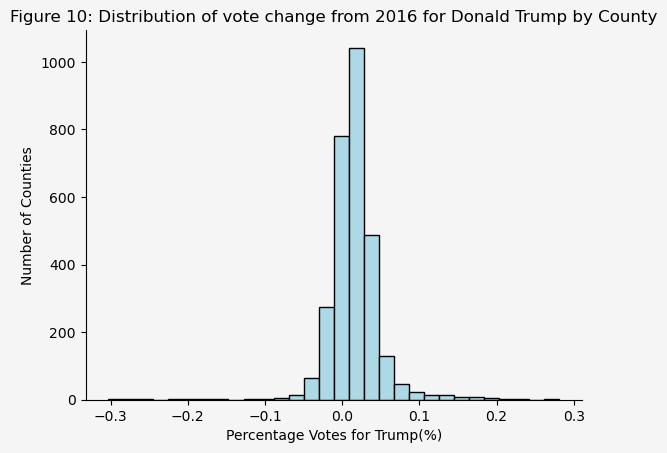

In [18]:
fig, ax = plt.subplots()
df_merged.plot(
    kind="hist", y="vote_change", color='lightblue', edgecolor='black',
    bins=30, legend=False, density=False, ax=ax
)
ax.set_facecolor((0.96, 0.96, 0.96))
fig.set_facecolor((0.96, 0.96, 0.96))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_title("Figure 10: Distribution of vote change from 2016 for Donald Trump by County")
ax.set_xlabel('Percentage Votes for Trump(%)')
ax.set_ylabel('Number of Counties')

Figure 10 shows the distribution of change of percentage for Trump from 2016. We can observe that the majority is concentrated between -0.1 to 0.1, meaning that most counties they do not change there votes significantly.

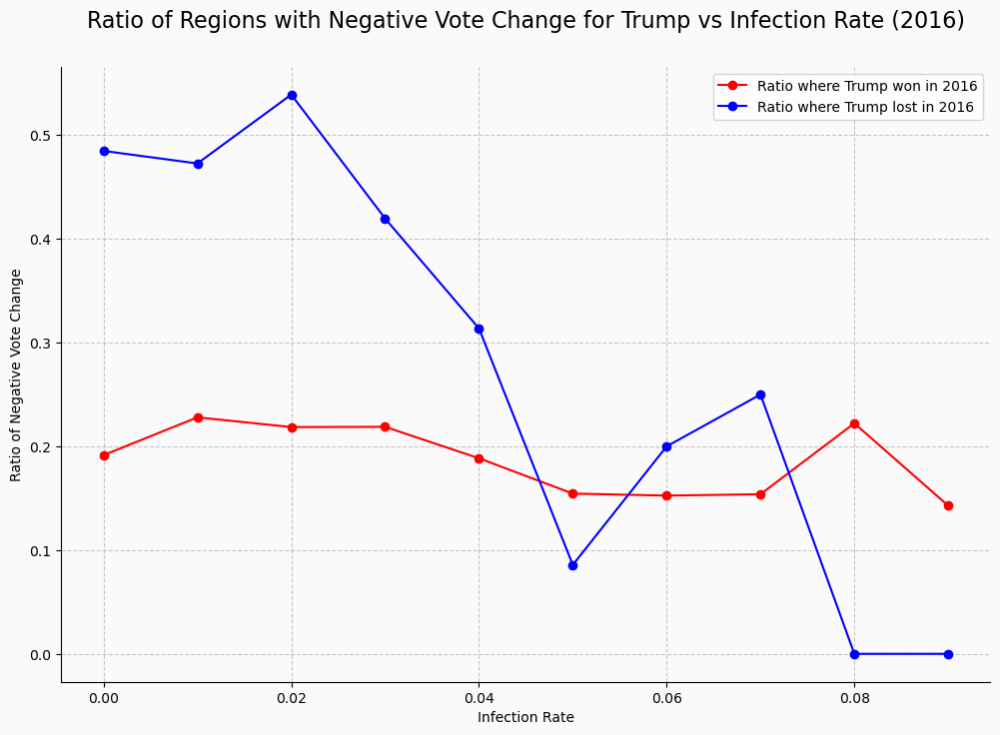

In [39]:
# Filter based on 2016 election outcome
trump_won = df_merged[df_merged['win_2016'] == 1]
biden_won = df_merged[df_merged['win_2016'] == 0]

# Define bins for infection rate
bins = np.arange(0, 0.101, 0.01)

# Calculate ratios for each infection rate bin

# Trump won group
trump_negative_vote_change = (trump_won['vote_change'] < 0).astype(int)
trump_won_counts, _ = np.histogram(trump_won['infection_rate'], bins=bins)
trump_negative_counts, _ = np.histogram(trump_won['infection_rate'][trump_negative_vote_change == 1], bins=bins)
trump_won_ratio = trump_negative_counts / (trump_won_counts + 1e-10)  # Small constant to avoid division by zero

# Trump lost group (i.e., Clinton won)
biden_negative_vote_change = (biden_won['vote_change'] < 0).astype(int)
biden_won_counts, _ = np.histogram(biden_won['infection_rate'], bins=bins)
biden_negative_counts, _ = np.histogram(biden_won['infection_rate'][biden_negative_vote_change == 1], bins=bins)
biden_won_ratio = biden_negative_counts / (biden_won_counts + 1e-10)  # Small constant to avoid division by zero

# Remove the top and right axis spines
def remove_spines(ax):
    """
    Remove the spines
    """
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

# Set the background color and plot
bgcolor = (250/255, 250/255, 250/255)

plt.figure(figsize=(12, 8), facecolor=bgcolor)
plt.plot(bins[:-1], trump_won_ratio, color='red', marker='o', label='Ratio where Trump won in 2016')
plt.plot(bins[:-1], biden_won_ratio, color='blue', marker='o', label='Ratio where Trump lost in 2016')
plt.title('Ratio of Regions with Negative Vote Change for Trump vs Infection Rate (2016)', 
          y = 1.05,
         fontsize=16)
plt.xlabel('Infection Rate')
plt.ylabel('Ratio of Negative Vote Change')
ax = plt.gca()
ax.set_facecolor(bgcolor)
ax.grid(linestyle='--', alpha=0.7)
remove_spines(ax)
plt.legend()
plt.show()


Figure 11 shows the counties voting less for Trump for all infection rates. However, the blue line represents the counties that Trump lost in 2016, and the red line represents those that Trump won in 2016. The graph shows that these two categories of counties show different trends, and Trump even lost support from the counties that supported him in 2016. To be more precise, the counties that voted for Trump in 2016 seems to have fluctuated around 0.2 across all infection rate compared to the counties that Clinton won in 2016. These counties seem more sensitive to COVID, meaning that about half of them voted less in 2020 than in 2016 to Trump. Even though the ratio decreased dramatically to about 0.2, it still exceeds the counties that Trump won in 2016. 

From this graph, we can see that COVID prevented Trump from gaining the support of the countries he lost in 2016 and failed to protect the countries that supported him in 2016 to support him again in 2020. However, even though both groups of counties have counties voting negatively for Trump, there is a massive gap between them, and I will take a closer look at the regression part.

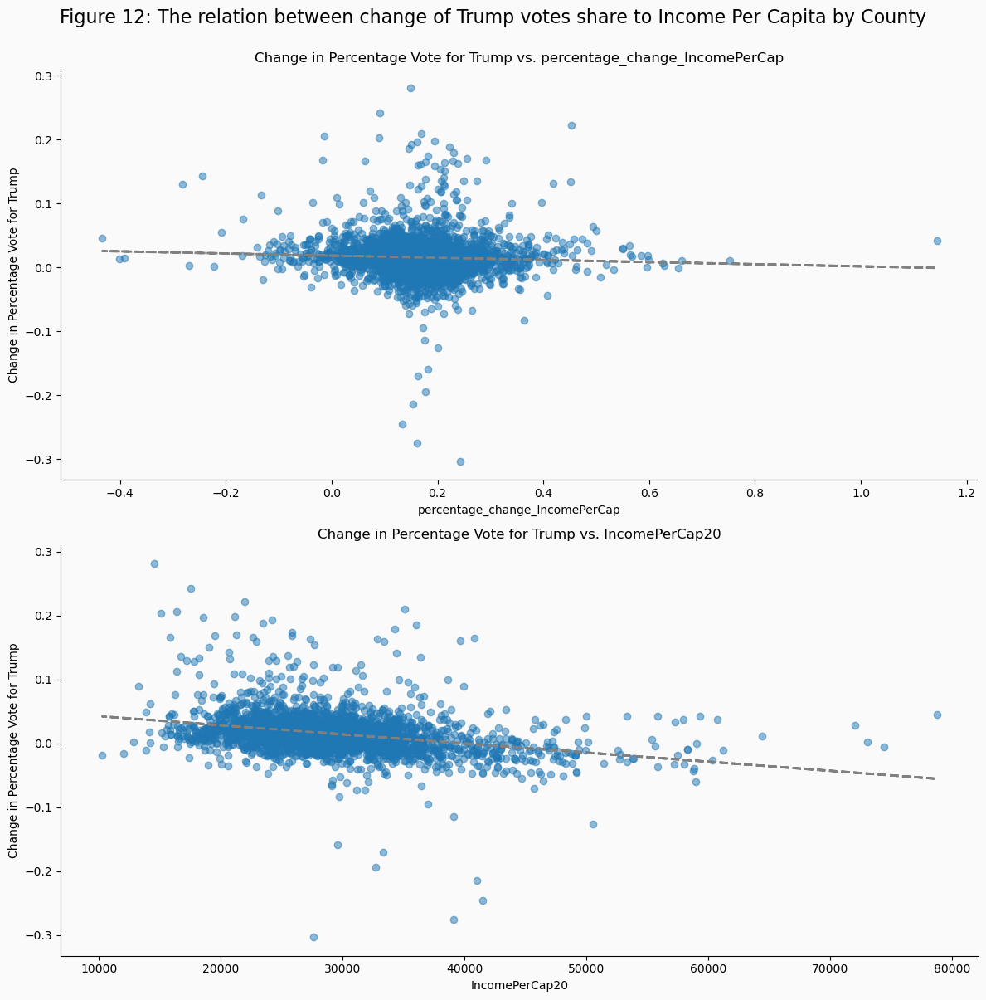

In [20]:
# Calculate the percentage change in income per capita from 2016 to 2020
def plot_scatter_and_regression(x_col, ax):
    """
    Plot scatter and regression line for a given X-variable against Change in Percentage Vote for Trump.
    """
    X = df_merged[x_col].values.reshape(-1, 1)
    y = df_merged["vote_change"]
    
    # Fit the linear regression model
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    # Plot
    ax.scatter(df_merged[x_col], df_merged["vote_change"], alpha=0.5)
    ax.plot(df_merged[x_col], y_pred, color='grey', linewidth=2, linestyle='--')
    ax.set_title(f"Change in Percentage Vote for Trump vs. {x_col}")
    ax.set_xlabel(x_col)
    ax.set_ylabel("Change in Percentage Vote for Trump")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_facecolor(bgcolor)

bgcolor = (250/255, 250/255, 250/255)
# Create the combined plot
fig, axes = plt.subplots(2, 1, figsize=(12, 12), facecolor=bgcolor)
fig.suptitle("Figure 12: The relation between change of Trump votes share to Income Per Capita by County", 
             y = 1, fontsize=16)
plot_scatter_and_regression("percentage_change_IncomePerCap", axes[0])
plot_scatter_and_regression("IncomePerCap20", axes[1])
plt.tight_layout()
plt.show()

Figure 12 shows the scatter plot between the income per capita in 2020 and the change of income per capita to the shift in percentage votes. From the graph, we can see a negative slope line in both subplots, meaning that the rich people or the people who became rich voted less for Trump. This pattern matches what we found in the Message Part. This can give us insights into predicting the vote change using income per capita in 2020 and its change from 2016. I will show more on this in the regression part.

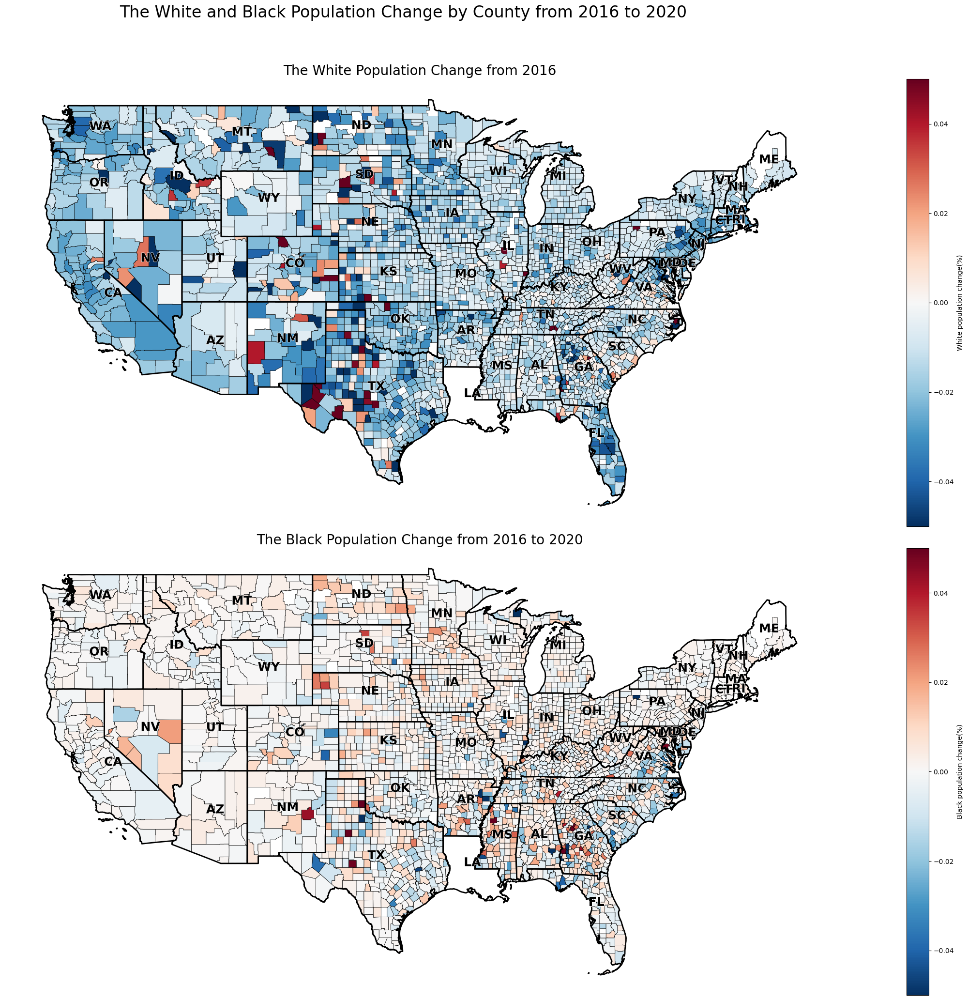

In [21]:
data_columns = ['White_change', 'Black_change']
cmaps = ['RdBu_r', 'RdBu_r']
vmins = [-0.05, -0.05]
vmaxs = [0.05, 0.05]
legend_labels = ["White population change(%)", "Black population change(%)"]
titles = ["The White Population Change from 2016", "The Black Population Change from 2016 to 2020"]
main_title = "The White and Black Population Change by County from 2016 to 2020"

fig, axs = plt.subplots(2, 1, figsize=(30, 20))
generate_plots(df_merged_geom, axs, data_columns, cmaps, vmins, vmaxs, legend_labels, titles, main_title)

Figure 13 shows the population change for the Whites and Blacks from 2016 to 2020 across each county. The red and blue represent the negative and positive change in the population percentage, respectively. However, the Black and White populations seem to have a different pattern. The graph shows that most counties had an adverse change in the percentage of the White population. However, there was no significant change in the ratio of the Black population in most counties. Most counties show a bright color or white.

There seems to be a higher percentage change in the White population than in the Black. It is worth investigating whether COVID-19 causes this difference and whether this will influence the voting patterns for Trump. I will discuss more about this part in the next part.

## OLS Regression

In this part, I will perform OLS regression to show the relationship between the dependent and independent variables. Once again, the dependent variable in my project is the change of voting share for Donald Trump from 2016 to 2020. However, with the merge data, my independent variables are now more various. The independent variables are consisted of three main parts: COVID metrics, socio-economic indicators and demographic indicators. More precisely, the COVID metrics include the COVID-19 infection and death rate for each county in 2020. The socio-economic indicators are values of income per capita and unemployment rate in 2020, as well as their change from 2016 to 2020. In addition, the demographic variables include the percentage of White, Black and Female in each county in 2020, as well as their percent changed from 2016.

I will create my linear regressions step-by-step, and contains dummy variables and interaction terms as model goes more complicated.

In [22]:
# yuanbende
import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col
from linearmodels.iv import IV2SLS

df_merged['const'] = 1
df_merged['PctChg_IncCap_Div10'] = df_merged['percentage_change_IncomePerCap'] / 10

df_merged['UnempChg'] = df_merged['Unemployment_change']

df_merged['IncCap20_Div100k'] = df_merged['IncomePerCap20'] / 100000

df_merged['Pct20Wht'] = df_merged['percentage20_White']

df_merged['Pct20Blk'] = df_merged['percentage20_Black']

df_merged['Pct20Fem'] = df_merged['percentage20_Female']

In [23]:
def run_regression(y, X, data, missing='drop'):
    """
    Run an OLS regression.

    Parameters:
    y (str) : Name of the response variable
    X (list) : List of predictor variables
    data (DataFrame) : Data frame containing the data
    missing (str) : How to handle missing data. Default is 'drop'.

    Returns:
    Regression results
    """
    return sm.OLS(data[y], data[X], missing=missing).fit()

def generate_summary_table(results, regressor_order, float_format='%0.3f'):
    """
    Generate a summary table for given regression results.

    Parameters:
    results (list) : List of regression results
    model_names (list) : Names of the models
    regressor_order (list) : Order of regressors in the table
    float_format (str) : Format for the float numbers. Default is '%0.3f'.

    Returns:
    Summary table
    """
    # Info dictionary with AIC, BIC, and adjusted R^2
    info_dict = {
        'AIC': lambda x: f"{x.aic:.3f}",
        'BIC': lambda x: f"{x.bic:.3f}",
        'MSE': lambda x: f"{((x.resid ** 2).mean()):.5f}",
        'No. observations' : lambda x: f"{int(x.nobs):d}"
    }

    return summary_col(results=results,
                       float_format=float_format,
                       stars=True,
                       model_names = ['Model 1', 'Model 2', 'Model 3', 'Model 4', 'Best Model'],
                       info_dict=info_dict,
                       regressor_order=regressor_order)

In [24]:
X1 = ['const', 'infection_rate', 'deaths_rate']
X2 = X1 + ['PctChg_IncCap_Div10', 'UnempChg', 'White_change', 
           'Black_change', 'Female_change']
X3 = X1 + ['IncCap20_Div100k', 'Unemployment20', 'Pct20Wht', 
           'Pct20Blk', 'Pct20Fem']
X4 = list(set(X1 + X2 + X3))
best1 = ['const', 'infection_rate','deaths_rate', 
        'PctChg_IncCap_Div10',
        'UnempChg', 'White_change',
        'IncCap20_Div100k', 'Unemployment20', 'Pct20Wht', 
        'Pct20Blk', 'Pct20Fem']

X_lists = [X1, X2, X3, X4, best1]
regressor_order=['const', 'infection_rate','deaths_rate', 'PctChg_IncCap_Div10',
                 'UnempChg', 'White_change', 'Black_change', 
                 'Female_change', 'IncCap20_Div100k', 'Unemployment20', 
                 'Pct20Wht', 
                 'Pct20Blk', 
                 'Pct20Fem']

regressions = [run_regression('vote_change', X, df_merged) for X in X_lists]

**Table 3.2.1:** The summary table of linear regression without dummy variables or interactions

|                     | Model 1   | Model 2   | Model 3   | Model 4   | Best Model |
|---------------------|-----------|-----------|-----------|-----------|------------|
| **const**           | 0.013***  | 0.018***  | 0.140***  | 0.131***  | 0.139***   |
|                     | (0.001)   | (0.002)   | (0.012)   | (0.013)   | (0.012)    |
| **infection_rate**  | 0.084**   | 0.084**   | -0.077**  | -0.072*   | -0.074*    |
|                     | (0.040)   | (0.040)   | (0.038)   | (0.038)   | (0.038)    |
| **deaths_rate**     | 1.271     | 1.134     | 4.178***  | 3.866***  | 4.011***   |
|                     | (1.197)   | (1.200)   | (1.205)   | (1.201)   | (1.200)    |
| **PctChg_IncCap_Div10** |       | -0.200*** |           | 0.204***  | 0.201***   |
|                           |       | (0.063)   |           | (0.062)   | (0.062)    |
| **UnempChg**             |       | -0.007    |           | 0.083***  | 0.080***   |
|                           |       | (0.027)   |           | (0.028)   | (0.028)    |
| **White_change**         |       | 0.148***  |           | 0.133***  | 0.144***   |
|                           |       | (0.035)   |           | (0.034)   | (0.032)    |
| **Black_change**         |       | -0.169*** |           | -0.073    |            |
|                           |       | (0.061)   |           | (0.057)   |            |
| **Female_change**        |       | -0.120**  |           | -0.091*   |            |
|                           |       | (0.051)   |           | (0.051)   |            |
| **IncCap20_Div100k**     |       |           | -0.173*** | -0.184*** | -0.182***  |
|                           |       |           | (0.009)   | (0.010)   | (0.010)    |
| **Unemployment20**       |       |           | -0.169*** | -0.206*** | -0.203***  |
|                           |       |           | (0.027)   | (0.028)   | (0.028)    |
| **Pct20Wht**             |       |           | -0.023*** | -0.029*** | -0.029***  |
|                           |       |           | (0.004)   | (0.004)   | (0.004)    |
| **Pct20Blk**             |       |           | -0.058*** | -0.061*** | -0.061***  |
|                           |       |           | (0.005)   | (0.006)   | (0.006)    |
| **Pct20Fem**             |       |           | -0.086*** | -0.050*   | -0.066***  |
|                           |       |           | (0.024)   | (0.026)   | (0.024)    |
| **R-squared**            | 0.004  | 0.019     | 0.153     | 0.165     | 0.164      |
| **R-squared Adj.**       | 0.003  | 0.017     | 0.151     | 0.162     | 0.161      |
| **AIC**                  | -11703.060 | -11738.425 | -12169.173 | -12201.198 | -12200.838 |
| **BIC**                  | -11685.115 | -11690.571 | -12121.319 | -12123.435 | -12135.039 |
| **MSE**                  | 0.00107 | 0.00106   | 0.00091   | 0.00090   | 0.00090    |
| **No. observations**     | 2927   | 2927      | 2927      | 2927      | 2927       |
*Standard errors in parentheses.*  
*p<.1, ** p<.05, ***p<.01*

Table 3.2.1 summarizes five linear regression models where we only include the variables themselves. The difference between the first four tables is the different arrangements of variables, and the fifth is the best model in this situation. In addition, the algorithms behind each arrangement are different. Each model contains the main variables: the infection and death rates. Model 1 only includes the main variables. For both Model 2 and Model 3, I include the socio-economic and demographic variables. Still, the difference between the two models is that Model 2 indicates the change of these variables to the vote change, and Model 3 shows these values in 2020. Moreover, Model 5 aggregates the first three models, containing all the variables in our regression. Furthermore, the Best Model is the model that is justified by the previous model with the trade-off between the significance of each variable and the overall adjusted R squared.

From the table, we can see that the adjusted R squared increases gradually if we add more variables to our model. For the Best Model, we can see that each coefficient is significant. We can observe a negative impact on the infection rate but a positive negative on the death rate on the voting share for Donald Trump. In addition, we can see that both the socio-economic and demographic variables negatively impact the percentage of voters for Trump.

In the next part, I will include dummy variables in my regressions.

In [25]:
# Create dummy variables based on these thresholds
income_thresholds = [df_merged['IncomePerCap20'].quantile(0.25),
                     df_merged['IncomePerCap20'].quantile(0.75)]
df_merged['IncGrpLow'] = (df_merged['IncomePerCap20'] < income_thresholds[0]).astype(int)
df_merged['IncGrpMed'] = ((df_merged['IncomePerCap20'] >= income_thresholds[0]) & 
                                   (df_merged['IncomePerCap20'] < income_thresholds[1])).astype(int)

# Note: The medium group will be implicit (i.e., when both dummies are 0)

# Update the lists of variables for each regression to include the new dummy variables
dummy = ['IncGrpLow', 'IncGrpMed']
X1_new = X1 + dummy
X2_new = X2 + dummy
X3_new = X3 + dummy
X4_new = X4 + dummy
best1 = best1 + ['Female_change']
best2 = best1 + dummy

X_lists = [X1_new, X2_new, X3_new, X4_new, best2]
regressor_order=['const', 'IncGrpLow', 'IncGrpMed',
                 'infection_rate','deaths_rate', 
                 'PctChg_IncCap_Div10','UnempChg', 
                 'White_change', 'Black_change', 
                 'Female_change', 'IncCap20_Div100k', 
                 'Unemployment20', 'Pct20Wht', 
                 'Pct20Blk', 'Pct20Fem']

regressions = [run_regression('vote_change', X, df_merged) for X in X_lists]

**Table 3.2.2:** The summary table of linear regression with dummy variable of income group

|                     | Model 1   | Model 2   | Model 3   | Model 4   | Best Model |
|---------------------|-----------|-----------|-----------|-----------|------------|
| **const**           | 0.002     | 0.005**   | 0.125***  | 0.114***  | 0.116***   |
|                     | (0.001)   | (0.002)   | (0.014)   | (0.014)   | (0.014)    |
| **IncGrpLow**       | 0.025***  | 0.025***  | 0.008***  | 0.009***  | 0.009***   |
|                     | (0.002)   | (0.002)   | (0.003)   | (0.003)   | (0.003)    |
| **IncGrpMed**       | 0.015***  | 0.015***  | 0.003     | 0.003     | 0.003      |
|                     | (0.001)   | (0.001)   | (0.002)   | (0.002)   | (0.002)    |
| **infection_rate**  | 0.008     | 0.007     | -0.081**  | -0.078**  | -0.080**   |
|                     | (0.039)   | (0.039)   | (0.038)   | (0.038)   | (0.038)    |
| **deaths_rate**     | -0.456    | -0.225    | 3.942***  | 3.621***  | 3.673***   |
|                     | (1.171)   | (1.174)   | (1.206)   | (1.202)   | (1.201)    |
| **PctChg_IncCap_Div10** |      | -0.003    |           | 0.225***  | 0.229***   |
|                           |      | (0.063)   |           | (0.062)   | (0.062)    |
| **UnempChg**             |      | 0.067**   |           | 0.091***  | 0.091***   |
|                           |      | (0.027)   |           | (0.028)   | (0.028)    |
| **White_change**         |      | 0.094***  |           | 0.127***  | 0.138***   |
|                           |      | (0.034)   |           | (0.034)   | (0.032)    |
| **Black_change**         |      | -0.132**  |           | -0.068    |            |
|                           |      | (0.059)   |           | (0.057)   |            |
| **Female_change**        |      | -0.144*** |           | -0.100**  | -0.093*    |
|                           |      | (0.050)   |           | (0.051)   | (0.050)    |
| **IncCap20_Div100k**     |      |           | -0.142*** | -0.152*** | -0.152***  |
|                           |      |           | (0.015)   | (0.016)   | (0.016)    |
| **Unemployment20**       |      |           | -0.178*** | -0.220*** | -0.220***  |
|                           |      |           | (0.027)   | (0.028)   | (0.028)    |
| **Pct20Wht**             |      |           | -0.022*** | -0.027*** | -0.028***  |
|                           |      |           | (0.004)   | (0.004)   | (0.004)    |
| **Pct20Blk**             |      |           | -0.059*** | -0.061*** | -0.062***  |
|                           |      |           | (0.005)   | (0.006)   | (0.006)    |
| **Pct20Fem**             |      |           | -0.082*** | -0.042    | -0.045*    |
|                           |      |           | (0.024)   | (0.026)   | (0.026)    |
| **R-squared**            | 0.073 | 0.083     | 0.156     | 0.169     | 0.169      |
| **R-squared Adj.**       | 0.072 | 0.080     | 0.154     | 0.165     | 0.165      |
| **AIC**                  | -11911.504 | -11931.724 | -12176.342 | -12210.479 | -12211.051 |
| **BIC**                  | -11881.596 | -11871.906 | -12116.525 | -12120.753 | -12127.307 |
| **MSE**                  | 0.00100 | 0.00099  | 0.00091   | 0.00089   | 0.00089    |
| **No. observations**     | 2927   | 2927     | 2927      | 2927      | 2927       |
*Standard errors in parentheses.*  
*p<.1, ** p<.05, ***p<.01*

Table 3.2.2 shows the summary of the five models following the same algorithms. However, I create two dummy variables in this table to illustrate whether this county has a low or medium income per capita and put them on each model. Like the previous models, the adjusted R squared increases as we include more variables. By the way, if we compare vertically, we can see the same model with dummy variables has a higher adjusted R squared than the model without dummy variables. Like Table 1, we can still observe a negative impact of the COVID-19 infection rate and a positive effect of the COVID-19 death rate on the vote percentage change of Trump. In addition, we can see that the coefficients for each group are positive, meaning that the lower-income counties are more willing to vote for Trump.

The above table includes the dummy variable about the income per capita. However, from previous visualizations, we see that the counties that Trump won in 2016 also matter; I will include this in my models shortly.

In [26]:
# Update the lists of variables for each regression to include the new dummy variables
dummy = ['win_2016']
X1_new = X1 + dummy
X2_new = X2 + dummy
X3_new = X3 + dummy
X4_new = X4 + dummy
best2 = best1 + dummy
X_lists = [X1_new, X2_new, X3_new, X4_new, best2]

regressor_order = ['const', 'win_2016', 'infection_rate', 
                   'deaths_rate', 'PctChg_IncCap_Div10', 
                   'UnempChg_Div1k', 'White_change', 
                   'Black_change', 'Female_change', 
                   'IncCap20_Div100k', 'Unemployment20', 
                   'Pct20Wht', 'Pct20Blk', 'Pct20Fem']

regressions = [run_regression('vote_change', X, df_merged) for X in X_lists]

**Table 3.2.3:** The summary table of linear regression with dummy variable of win at 2016


|                     | Model 1   | Model 2   | Model 3   | Model 4   | Best Model |
|---------------------|-----------|-----------|-----------|-----------|------------|
| **const**           | 0.009***  | 0.015***  | 0.150***  | 0.141***  | 0.143***   |
|                     | (0.002)   | (0.002)   | (0.013)   | (0.013)   | (0.013)    |
| **win_2016**        | 0.004**   | 0.003*    | -0.010*** | -0.010*** | -0.010***  |
|                     | (0.002)   | (0.002)   | (0.002)   | (0.002)   | (0.002)    |
| **infection_rate**  | 0.079**   | 0.081**   | -0.062    | -0.058    | -0.061     |
|                     | (0.040)   | (0.040)   | (0.038)   | (0.038)   | (0.038)    |
| **deaths_rate**     | 1.757     | 1.457     | 4.266***  | 3.970***  | 4.040***   |
|                     | (1.213)   | (1.216)   | (1.200)   | (1.195)   | (1.195)    |
| **PctChg_IncCap_Div10** |      | -0.191*** |           | 0.220***  | 0.224***   |
|                           |      | (0.063)   |           | (0.062)   | (0.061)    |
| **White_change**         |      | 0.143***  |           | 0.124***  | 0.138***   |
|                           |      | (0.035)   |           | (0.034)   | (0.032)    |
| **Black_change**         |      | -0.165*** |           | -0.091    |            |
|                           |      | (0.061)   |           | (0.057)   |            |
| **Female_change**        |      | -0.119**  |           | -0.094*   | -0.083*    |
|                           |      | (0.051)   |           | (0.050)   | (0.050)    |
| **IncCap20_Div100k**     |      |           | -0.190*** | -0.204*** | -0.204***  |
|                           |      |           | (0.010)   | (0.010)   | (0.010)    |
| **Unemployment20**       |      |           | -0.185*** | -0.227*** | -0.227***  |
|                           |      |           | (0.027)   | (0.028)   | (0.028)    |
| **Pct20Wht**             |      |           | -0.015*** | -0.020*** | -0.020***  |
|                           |      |           | (0.004)   | (0.004)   | (0.004)    |
| **Pct20Blk**             |      |           | -0.061*** | -0.063*** | -0.064***  |
|                           |      |           | (0.005)   | (0.006)   | (0.006)    |
| **Pct20Fem**             |      |           | -0.091*** | -0.054**  | -0.056**   |
|                           |      |           | (0.024)   | (0.026)   | (0.026)    |
| **UnempChg**             |      | -0.010    |           | 0.094***  | 0.094***   |
|                           |      | (0.027)   |           | (0.028)   | (0.028)    |
| **R-squared**            | 0.006 | 0.020     | 0.161     | 0.174     | 0.173      |
| **R-squared Adj.**       | 0.004 | 0.017     | 0.159     | 0.170     | 0.170      |
| **AIC**                  | -11706.799 | -11739.172 | -12195.097 | -12230.345 | -12229.773 |
| **BIC**                  | -11682.872 | -11685.336 | -12141.262 | -12146.600 | -12152.011 |
| **MSE**                  | 0.00107 | 0.00105   | 0.00090   | 0.00089   | 0.00089    |
| **No. observations**     | 2927   | 2927      | 2927      | 2927      | 2927       |
*Standard errors in parentheses.*  
*p<.1, ** p<.05, ***p<.01*

Table 3.2.3 summarises the regression models after we include the dummy variable showing whether Trump won the country in 2016. From this table, we can see that even though the infection rate still indicates a negative impact, we can see that it is not statistically significant. Moreover, we observe that our dummy variable hurts the change in the voting share of Trump from 2016, and it is statistically significant. We may conclude that the counties that Trump won in 2016 were continuously less likely to vote for Trump in 2020. Furthermore, we can still observe that both the coefficients of the socioeconomic or demographic variables are negative, meaning that they both negatively affect Trump's voting patterns.

In [27]:
dummy = ['win_2016', 'IncGrpLow', 'IncGrpMed']
X1_new = X1 + dummy
X2_new = X2 + dummy
X3_new = X3 + dummy
X4_new = X4 + dummy
best2 = best1 + dummy
X_lists = [X1_new, X2_new, X3_new, X4_new, best2]

regressor_order = ['const', 'win_2016', 'IncGrpLow', 
                   'IncGrpMed', 'infection_rate', 
                   'deaths_rate', 'PctChg_IncCap_Div10', 
                   'UnempChg_Div1k', 'White_change', 
                   'Black_change', 'Female_change', 
                   'IncCap20_Div100k', 'Unemployment20', 
                   'Pct20Wht', 'Pct20Blk', 'Pct20Fem']


regressions = [run_regression('vote_change', X, df_merged) for X in X_lists]

**Table 3.2.4:** The summary table of linear regression with both dummy variables

|                     | Model 1   | Model 2   | Model 3   | Model 4   | Best Model |
|---------------------|-----------|-----------|-----------|-----------|------------|
| **const**           | 0.002     | 0.005**   | 0.134***  | 0.124***  | 0.125***   |
|                     | (0.002)   | (0.002)   | (0.014)   | (0.014)   | (0.014)    |
| **win_2016**        | -0.000    | -0.001    | -0.009*** | -0.010*** | -0.010***  |
|                     | (0.002)   | (0.002)   | (0.002)   | (0.002)   | (0.002)    |
| **IncGrpLow**       | 0.025***  | 0.025***  | 0.008***  | 0.009***  | 0.009***   |
|                     | (0.002)   | (0.002)   | (0.003)   | (0.003)   | (0.003)    |
| **IncGrpMed**       | 0.015***  | 0.015***  | 0.003     | 0.003     | 0.003      |
|                     | (0.001)   | (0.001)   | (0.002)   | (0.002)   | (0.002)    |
| **infection_rate**  | 0.008     | 0.008     | -0.065*   | -0.063    | -0.066*    |
|                     | (0.039)   | (0.039)   | (0.038)   | (0.038)   | (0.038)    |
| **deaths_rate**     | -0.459    | -0.334    | 4.051***  | 3.742***  | 3.805***   |
|                     | (1.187)   | (1.189)   | (1.201)   | (1.196)   | (1.195)    |
| **PctChg_IncCap_Div10** |      | -0.005    |           | 0.239***  | 0.243***   |
|                           |      | (0.063)   |           | (0.062)   | (0.062)    |
| **White_change**         |      | 0.095***  |           | 0.119***  | 0.132***   |
|                           |      | (0.034)   |           | (0.034)   | (0.032)    |
| **Black_change**         |      | -0.133**  |           | -0.086    |            |
|                           |      | (0.059)   |           | (0.057)   |            |
| **Female_change**        |      | -0.145*** |           | -0.103**  | -0.093*    |
|                           |      | (0.050)   |           | (0.050)   | (0.050)    |
| **IncCap20_Div100k**     |      |           | -0.158*** | -0.171*** | -0.170***  |
|                           |      |           | (0.016)   | (0.016)   | (0.016)    |
| **Unemployment20**       |      |           | -0.193*** | -0.240*** | -0.240***  |
|                           |      |           | (0.027)   | (0.028)   | (0.028)    |
| **Pct20Wht**             |      |           | -0.014*** | -0.018*** | -0.019***  |
|                           |      |           | (0.004)   | (0.004)   | (0.004)    |
| **Pct20Blk**             |      |           | -0.062*** | -0.064*** | -0.064***  |
|                           |      |           | (0.005)   | (0.006)   | (0.006)    |
| **Pct20Fem**             |      |           | -0.087*** | -0.047*   | -0.050*    |
|                           |      |           | (0.024)   | (0.026)   | (0.026)    |
| **UnempChg**             |      | 0.068**   |           | 0.102***  | 0.102***   |
|                           |      | (0.027)   |           | (0.028)   | (0.028)    |
| **R-squared**            | 0.073 | 0.083     | 0.164     | 0.178     | 0.177      |
| **R-squared Adj.**       | 0.072 | 0.080     | 0.161     | 0.173     | 0.173      |
| **AIC**                  | -11909.505 | -11930.080 | -12201.499 | -12239.024 | -12238.730 |
| **BIC**                  | -11873.614 | -11864.281 | -12135.700 | -12143.316 | -12149.004 |
| **MSE**                  | 0.00100 | 0.00099   | 0.00090   | 0.00088   | 0.00089    |
| **No. observations**     | 2927   | 2927      | 2927      | 2927      | 2927       |
*Standard errors in parentheses.*  
*p<.1, ** p<.05, ***p<.01*


Based on Table 3.2.2 and Table 3.2.3, we now include both the dummy variables about income per capita and whether Trump won in 2016. We can now observe that the adjusted R squared the Best Model in the above table is higher than any previous model. After combining them, it still shows that the higher income per capita and those counties voting for Trump in 2016 are less likely to vote for Trump in 2020. Except for the medium-income counties, both variables are statistically significant for predicting the change in percentage votes for Donald Trump.

The previous four tables show all my linear regression models. However, there could be non-linearity between each independent variable. To avoid non-linearity, I will include the interaction terms based on the previous findings in my models.

In [28]:
# Create interaction terms
df_merged['IncGrpLow:infection'] = df_merged['infection_rate'] * df_merged['IncGrpLow']
df_merged['IncGrpMed:infection'] = df_merged['infection_rate'] * df_merged['IncGrpMed']
df_merged['IncGrpLow:deaths'] = df_merged['deaths_rate'] * df_merged['IncGrpLow']
df_merged['IncGrpMed:deaths'] = df_merged['deaths_rate'] * df_merged['IncGrpMed']

# Update regression model specifications
interactions = ['IncGrpLow', 'IncGrpMed',
                'IncGrpLow:infection', 'IncGrpMed:infection', 
                'IncGrpLow:deaths', 'IncGrpMed:deaths']
X1_interactions = X1 + interactions
X2_interactions = X2 + interactions
X3_interactions = X3 + interactions
X4_interactions = X4 + interactions
best3 = best1 + interactions
X_lists = [X1_interactions, X2_interactions, X3_interactions, X4_interactions, best3]

regressor_order = ['const', 'IncGrpLow', 'IncGrpMed', 
                   'IncGrpLow:infection', 
                   'IncGrpMed:infection', 
                   'IncGrpLow:deaths', 
                   'IncGrpMed:deaths', 
                   'infection_rate', 'deaths_rate', 
                   'PctChg_IncCap_Div10', 'UnempChg', 
                   'White_change', 'Black_change', 
                   'Female_change', 'IncCap20_Div100k', 
                   'Unemployment20', 'Pct20Wht', 
                   'Pct20Blk', 'Pct20Fem']


regressions = [run_regression('vote_change', X, df_merged) for X in X_lists]

**Table 3.2.5:** The summary table of linear regression with interactions between Income Per Capita and COVID Metircs

|                     | Model 1   | Model 2   | Model 3   | Model 4   | Best Model |
|---------------------|-----------|-----------|-----------|-----------|------------|
| **const**           | -0.002    | 0.001     | 0.121***  | 0.110***  | 0.112***   |
|                     | (0.002)   | (0.003)   | (0.014)   | (0.014)   | (0.014)    |
| **IncGrpLow**       | 0.029***  | 0.029***  | 0.010**   | 0.011***  | 0.011***   |
|                     | (0.003)   | (0.003)   | (0.004)   | (0.004)   | (0.004)    |
| **IncGrpMed**       | 0.020***  | 0.020***  | 0.006*    | 0.006**   | 0.006**    |
|                     | (0.003)   | (0.003)   | (0.003)   | (0.003)   | (0.003)    |
| **IncGrpLow:infection** | -0.307*** | -0.313*** | -0.184* | -0.169  | -0.167     |
|                     | (0.105)   | (0.105)   | (0.103)   | (0.103)   | (0.103)    |
| **IncGrpMed:infection** | -0.268** | -0.250**  | -0.146  | -0.125   | -0.124     |
|                     | (0.107)   | (0.106)   | (0.103)   | (0.103)   | (0.103)    |
| **IncGrpLow:deaths**| 6.841**   | 7.417**   | 6.782**   | 6.101**   | 5.957**    |
|                     | (2.936)   | (2.931)   | (2.881)   | (2.875)   | (2.873)    |
| **IncGrpMed:deaths**| 2.622     | 2.408     | 1.160     | -0.132    | -0.139     |
|                     | (3.128)   | (3.126)   | (3.021)   | (3.013)   | (3.013)    |
| **infection_rate**  | 0.238***  | 0.233***  | 0.055     | 0.046     | 0.042      |
|                     | (0.086)   | (0.086)   | (0.084)   | (0.084)   | (0.084)    |
| **deaths_rate**     | -4.176*   | -4.154*   | 0.791     | 1.152     | 1.271      |
|                     | (2.338)   | (2.333)   | (2.280)   | (2.276)   | (2.275)    |
| **PctChg_IncCap_Div10** |      | 0.004     |           | 0.226***  | 0.230***   |
|                           |      | (0.063)   |           | (0.062)   | (0.062)    |
| **UnempChg**             |      | 0.064**   |           | 0.085***  | 0.085***   |
|                           |      | (0.027)   |           | (0.028)   | (0.028)    |
| **White_change**         |      | 0.091***  |           | 0.127***  | 0.139***   |
|                           |      | (0.034)   |           | (0.034)   | (0.032)    |
| **Black_change**         |      | -0.141**  |           | -0.076    |            |
|                           |      | (0.059)   |           | (0.057)   |            |
| **Female_change**        |      | -0.154*** |           | -0.104**  | -0.095*    |
|                           |      | (0.050)   |           | (0.051)   | (0.050)    |
| **IncCap20_Div100k**     |      |           | -0.134*** | -0.145*** | -0.145***  |
|                           |      |           | (0.016)   | (0.016)   | (0.016)    |
| **Unemployment20**       |      |           | -0.169*** | -0.210*** | -0.210***  |
|                           |      |           | (0.027)   | (0.029)   | (0.029)    |
| **Pct20Wht**             |      |           | -0.022*** | -0.027*** | -0.027***  |
|                           |      |           | (0.004)   | (0.004)   | (0.004)    |
| **Pct20Blk**             |      |           | -0.060*** | -0.063*** | -0.064***  |
|                           |      |           | (0.005)   | (0.006)   | (0.006)    |
| **Pct20Fem**             |      |           | -0.084*** | -0.044*   | -0.046*    |
|                           |      |           | (0.025)   | (0.026)   | (0.026)    |
| **R-squared**            | 0.077 | 0.087     | 0.159     | 0.172     | 0.171      |
| **R-squared Adj.**       | 0.075 | 0.083     | 0.155     | 0.167     | 0.166      |
| **AIC**                  | -11915.750 | -11936.785 | -12177.634 | -12211.798 | -12212.013 |
| **BIC**                  | -11861.914 | -11853.041 | -12093.889 | -12098.145 | -12104.
| **MSE**                  | 0.00100 | 0.00099   | 0.00090   | 0.00089   | 0.00089    |
| **No. observations**     | 2927   | 2927      | 2927      | 2927      | 2927       |
*Standard errors in parentheses.*  
*p<.1, ** p<.05, ***p<.01*

Table 3.2.5 shows the summary table for linear regression, including the interaction term between the income group and infection rate and death rate. We can see that the coefficient of the interaction between the low-income group and the infection rate is negative but positive for the interaction between the low-income group and the death rate. This indicates that the low-income group will reduce their support to Donald Trump more than the high-income group, but they increase their support much more than the high-income group when the death rate increases. However, the adjusted R squared decreases further to 0.166, compared to 0.173 in Table 4. This indicates that having interaction terms between income and COVID metrics might not be appropriate.

In [29]:
# Create interaction terms
df_merged['win_2016:infection'] = df_merged['infection_rate'] * df_merged['win_2016']
df_merged['win_2016:deaths'] = df_merged['deaths_rate'] * df_merged['win_2016']

# Update regression model specifications
interactions = ['win_2016',
                'win_2016:infection', 'win_2016:deaths']
X1_interactions = X1 + interactions
X2_interactions = X2 + interactions
X3_interactions = X3 + interactions
X4_interactions = X4 + interactions
best3 = best1 + interactions
X_lists = [X1_interactions, X2_interactions, X3_interactions, X4_interactions, best3]

regressor_order=['const', 'win_2016', 'win_2016:infection', 
               'win_2016:deaths',
               'infection_rate','deaths_rate', 
               'PctChg_IncCap_Div10',
               'UnempChg', 'White_change', 
               'Black_change', 'Female_change', 
               'IncCap20_Div100k', 'Unemployment20', 
               'Pct20Wht', 
               'Pct20Blk', 
               'Pct20Fem']

regressions = [run_regression('vote_change', X, df_merged) for X in X_lists]

**Table 3.2.6:** The summary table of linear regression with interactions between Win at 2016 and COVID Metircs

|                     | Model 1   | Model 2   | Model 3   | Model 4   | Best Model |
|---------------------|-----------|-----------|-----------|-----------|------------|
| **const**           | 0.003     | 0.010***  | 0.141***  | 0.133***  | 0.135***   |
|                     | (0.003)   | (0.003)   | (0.013)   | (0.013)   | (0.013)    |
| **win_2016**        | 0.012***  | 0.010***  | -0.006*   | -0.007**  | -0.007**   |
|                     | (0.003)   | (0.003)   | (0.003)   | (0.003)   | (0.003)    |
| **win_2016:infection** | 0.127  | 0.161     | 0.269***  | 0.311***  | 0.320***   |
|                     | (0.104)   | (0.104)   | (0.099)   | (0.099)   | (0.098)    |
| **win_2016:deaths** | -17.247*** | -17.577*** | -17.972*** | -19.117*** | -19.175*** |
|                     | (2.718)   | (2.709)   | (2.511)   | (2.497)   | (2.498)    |
| **infection_rate**  | -0.020    | -0.045    | -0.269*** | -0.299*** | -0.310***  |
|                     | (0.095)   | (0.095)   | (0.091)   | (0.091)   | (0.091)    |
| **deaths_rate**     | 13.807*** | 13.842*** | 17.410*** | 17.957*** | 18.072***  |
|                     | (2.313)   | (2.313)   | (2.197)   | (2.184)   | (2.184)    |
| **PctChg_IncCap_Div10** |       | -0.173*** |           | 0.239***  | 0.243***   |
|                           |       | (0.063)   |           | (0.061)   | (0.061)    |
| **UnempChg**             |       | 0.002     |           | 0.100***  | 0.100***   |
|                           |       | (0.027)   |           | (0.028)   | (0.028)    |
| **White_change**         |       | 0.150***  |           | 0.135***  | 0.149***   |
|                           |       | (0.035)   |           | (0.033)   | (0.032)    |
| **Black_change**         |       | -0.163*** |           | -0.088    |            |
|                           |       | (0.061)   |           | (0.056)   |            |
| **Female_change**        |       | -0.112**  |           | -0.093*   | -0.083*    |
|                           |       | (0.051)   |           | (0.050)   | (0.049)    |
| **IncCap20_Div100k**     |       |           | -0.189*** | -0.204*** | -0.204***  |
|                           |       |           | (0.010)   | (0.010)   | (0.010)    |
| **Unemployment20**       |       |           | -0.178*** | -0.222*** | -0.222***  |
|                           |       |           | (0.027)   | (0.028)   | (0.028)    |
| **Pct20Wht**             |       |           | -0.013*** | -0.018*** | -0.019***  |
|                           |       |           | (0.004)   | (0.004)   | (0.004)    |
| **Pct20Blk**             |       |           | -0.064*** | -0.067*** | -0.067***  |
|                           |       |           | (0.005)   | (0.006)   | (0.006)    |
| **Pct20Fem**             |       |           | -0.085*** | -0.045*   | -0.048*    |
|                           |       |           | (0.024)   | (0.026)   | (0.026)    |
| **R-squared**            | 0.022  | 0.036     | 0.176     | 0.191     | 0.190      |
| **R-squared Adj.**       | 0.020  | 0.032     | 0.173     | 0.187     | 0.186      |
| **AIC**                  | -11750.497 | -11783.191 | -12243.745 | -12285.903 | -12285.458 |
| **BIC**                  | -11714.607 | -11717.392 | -12177.946 | -12190.195 | -12195.732 |
| **MSE**                  | 0.00105 | 0.00104   | 0.00089    | 0.00087    | 0.00087    |
| **No. observations**     | 2927    | 2927      | 2927       | 2927       | 2927       |
*Standard errors in parentheses.*  
*p<.1, ** p<.05, ***p<.01*

Unlike Table 3.2.5, I created the interaction terms between the COVID metrics and indicators of Trump's voting in 2016 in Table 3.2.6. On the Best Model, we can observe that all the X variables are statistically significant for predicting the change in Trump's voting share. In general, the counties that Trump won in 2016 are less likely to vote for Donald Trump. However, we see that as the infection rate increase, the counties that Trump won in 2016 is expected to vote more in 2020; these countries vote less for Trump if there is an increase in the death rate.

In [30]:
df_merged['win_2016:IncGrpLow'] = df_merged['IncGrpLow'] * df_merged['win_2016']
df_merged['win_2016:IncGrpMed'] = df_merged['IncGrpMed'] * df_merged['win_2016']

# Update regression model specifications
interactions = ['win_2016', 'IncGrpLow', 'IncGrpMed', 
                'win_2016:infection', 'win_2016:deaths',
                'win_2016:IncGrpLow', 'win_2016:IncGrpMed']
X1_interactions = X1 + interactions
X2_interactions = X2 + interactions
X3_interactions = X3 + interactions
X4_interactions = X4 + interactions
best3 = best1 + interactions
X_lists = [X1_interactions, X2_interactions, X3_interactions, X4_interactions, best3]

regressor_order=['const', 'win_2016', 'IncGrpLow', 'IncGrpMed',
                 'win_2016:infection', 'win_2016:deaths',
                 'win_2016:IncGrpLow', 'win_2016:IncGrpMed', 
                 'infection_rate', 'deaths_rate', 
                 'PctChg_IncCap_Div10',
                 'UnempChg', 'White_change', 
                 'Black_change', 'Female_change', 
                 'IncCap20_Div100k', 'Unemployment20', 
                 'Pct20Wht', 
                 'Pct20Blk', 
                 'Pct20Fem']

regressions = [run_regression('vote_change', X, df_merged) for X in X_lists]

\newpage
### **Table 3.2.7:** The summary table of linear regression with interactions of Win at 2016between to income Per Capita and COVID Metircs

|                     | Model 1   | Model 2   | Model 3   | Model 4   | Best Model |
|---------------------|-----------|-----------|-----------|-----------|------------|
| **const**           | 0.004     | 0.008**   | 0.121***  | 0.111***  | 0.113***   |
|                     | (0.003)   | (0.003)   | (0.014)   | (0.014)   | (0.014)    |
| **win_2016**        | -0.001    | -0.002    | -0.007**  | -0.008**  | -0.008***  |
|                     | (0.003)   | (0.003)   | (0.003)   | (0.003)   | (0.003)    |
| **IncGrpLow**       | 0.045***  | 0.045***  | 0.032***  | 0.030***  | 0.030***   |
|                     | (0.004)   | (0.004)   | (0.005)   | (0.005)   | (0.005)    |
| **IncGrpMed**       | 0.012***  | 0.013***  | 0.002     | 0.001     | 0.001      |
|                     | (0.003)   | (0.003)   | (0.004)   | (0.004)   | (0.004)    |
| **win_2016:infection** | 0.543*** | 0.567*** | 0.435*** | 0.455***  | 0.462***   |
|                     | (0.108)   | (0.107)   | (0.103)   | (0.103)   | (0.103)    |
| **win_2016:deaths** | -13.067*** | -13.846*** | -14.280*** | -15.621*** | -15.670*** |
|                     | (2.679)   | (2.676)   | (2.551)   | (2.542)   | (2.542)    |
| **win_2016:IncGrpLow** | -0.025*** | -0.024*** | -0.025*** | -0.022*** | -0.022*** |
|                     | (0.004)   | (0.004)   | (0.004)   | (0.004)   | (0.004)    |
| **win_2016:IncGrpMed** | 0.002    | 0.001     | 0.002     | 0.003     | 0.003      |
|                     | (0.004)   | (0.004)   | (0.004)   | (0.004)   | (0.004)    |
| **infection_rate**  | -0.460*** | -0.481*** | -0.426*** | -0.438*** | -0.447***  |
|                     | (0.099)   | (0.099)   | (0.095)   | (0.095)   | (0.095)    |
| **deaths_rate**     | 8.367***  | 9.145***  | 14.214*** | 14.921*** | 15.019***  |
|                     | (2.296)   | (2.296)   | (2.229)   | (2.218)   | (2.217)    |
| **PctChg_IncCap_Div10** |       | -0.000    |           | 0.247***  | 0.251***   |
|                           |       | (0.062)   |           | (0.061)   | (0.061)    |
| **UnempChg**             |       | 0.078***  |           | 0.104***  | 0.104***   |
|                           |       | (0.027)   |           | (0.027)   | (0.027)    |
| **White_change**         |       | 0.097***  |           | 0.115***  | 0.128***   |
|                           |       | (0.034)   |           | (0.033)   | (0.032)    |
| **Black_change**         |       | -0.122**  |           | -0.082    |            |
|                           |       | (0.059)   |           | (0.056)   |            |
| **Female_change**        |       | -0.144*** |           | -0.101**  | -0.091*    |
|                           |       | (0.049)   |           | (0.050)   | (0.049)    |
| **IncCap20_Div100k**     |       |           | -0.142*** | -0.157*** | -0.157***  |
|                           |       |           | (0.016)   | (0.016)   | (0.016)    |
| **Unemployment20**       |       |           | -0.185*** | -0.232*** | -0.232***  |
|                           |       |           | (0.026)   | (0.028)   | (0.028)    |
| **Pct20Wht**             |       |           | -0.008**  | -0.013*** | -0.014***  |
|                           |       |           | (0.004)   | (0.004)   | (0.004)    |
| **Pct20Blk**             |       |           | -0.066*** | -0.068*** | -0.069***  |
|                           |       |           | (0.005)   | (0.005)   | (0.005)    |
| **Pct20Fem**             |       |           | -0.083*** | -0.042*   | -0.045*    |
|                           |       |           | (0.024)   | (0.026)   | (0.025)    |
| **R-squared**            | 0.098  | 0.108     | 0.191     | 0.204     | 0.204      |
| **R-squared Adj.**       | 0.096  | 0.104     | 0.187     | 0.199     | 0.199      |
| **AIC**                  | -11981.563 | -12004.197 | -12288.697 | -12327.051 | -12326.876 |
| **BIC**                  | -11921.746 | -11914.471 | -12198.971 | -12207.416 | -12213.223 |
| **MSE**                  | 0.00097    | 0.00096    | 0.00087    | 0.00086    | 0.00086    |
| **No. observations**     | 2927       | 2927       | 2927       | 2927       | 2927       |
*Standard errors in parentheses.*  
*p<.1, ** p<.05, ***p<.01*

Table 3.2.7 is our final table. In this table, I include all the dummy variables and interaction terms I discussed earlier, except the interaction between income and COVID metrics. The reason why do this is that some variables seem insignificant, meaning that there might be no relationships between the income group and COVID metrics to vote change. In addition to the previous models, I added the interactions between the two dummy variables. 

From the table, if we see the adjusted R squared, we can observe that it is 0.199, compared to 0.190 in Table 6. For the interaction between the two dummy variables, we see that the interaction between the low-income groups and whether Trump won in 2016 is negative and significant, indicating that the wealthier counties voting for Trump in 2016 will have less support for Trump in 2020. This matches our main message from Project Two.

To sum up both linear regression models from Table 1 to 8, the Best Model showing in Table 7 seem to be the best model. It has the highest adjusted R squared in all my models and all the variables except two are significant. I will shwo them in details next.

**The equation for the Best Model is:**

$$
\begin{aligned}
\mathit{voting\,share\,change\,for\,Trump} &= 0.113 \\
&- 0.008 \times \mathit{win\_2016} \\
&+ 0.03 \times \mathit{IncGrpLow} \\
&+ 0.01 \times \mathit{IncGrpMed} \\
&+ 0.462 \times \mathit{win\_2016 \times infection\_rate} \\
&- 15.670 \times \mathit{win\_2016 \times deaths\_rate} \\
&- 0.022 \times \mathit{win\_2016 \times IncGrpLow} \\
&+ 0.003 \times \mathit{win\_2016 \times IncGrpMed} \\
&- 0.447 \times \mathit{infection\_rate} \\
&+ 15.019 \times \mathit{deaths\_rate} \\
&+ 0.251 \times \mathit{PctChg\_IncCap\_Div10} \\
&+ 0.104 \times \mathit{UnempChg} \\
&+ 0.128 \times \mathit{White\_change} \\
&- 0.091 \times \mathit{Female\_change} \\
&- 0.157 \times \mathit{IncCap20\_Div100k} \\
&- 0.232 \times \mathit{Unemployment20} \\
&- 0.014 \times \mathit{Pct20Wht} \\
&- 0.069 \times \mathit{Pct20Blk} \\
&- 0.045 \times \mathit{Pct20Fem}
\end{aligned}
$$

In our regression model, the dependent variable is the change in voting share for Donald Trump across various counties in the United States. The model presents several fascinating dynamics. First, counties that Trump won in 2016 had a 0.8% decline in his voting share in the 2020 election. This suggests that the people living in those counties significantly lost their confidence in the 2020 Election.

However, the coefficient of interactions between the 2016 win and COVID infection rate is 0.462. This indicates that the counties Trump won in 2016 increased their support for him more than the counties he lost when the infection rates rose. In stark contrast, the negative coefficient of -15.670 for the interaction with death rates suggests a dramatic decline in support for Trump in these same counties as death rates increased.

In addition, income groups also show differentiated behaviors. Low-income and medium-income counties increased their vote share for Trump by 3% and 1%, compared to high-income counties. However, when we look at the interactions with a 2016 win, low-income counties reduced their support by an additional 2.2% in 2020. Meanwhile, medium-income counties showed a marginal increase of 0.3% compared to the high-income counties. 

Lastly, other variables add more layers of complexity. Higher death rates are surprisingly associated with increased Trump's voting share, while higher infection rates correlate with a decline. Socio-economic and demographic changes also play a role; the change of these variables from 2016 has a positive impact, but their values in 2020 hurt the shift in Trump's vote share.

## Machine Learning

In [31]:
df_regression = df_merged[['vote_change', 'infection_rate','deaths_rate', 'percentage_change_IncomePerCap',
                           'Unemployment_change', 'White_change', 'Black_change',
                           'Female_change', 'IncomePerCap20', 'Unemployment20', 
                           'percentage20_White', 'percentage20_Black', 'percentage20_Female']]

In [32]:
X = df_regression.drop(["vote_change"], axis=1).copy()
y = df_regression['vote_change']

In [33]:
from sklearn import tree
sqft_tree = tree.DecisionTreeRegressor(max_depth=3).fit(X,y)

# use the fitted tree to predict
y_pred_tree = sqft_tree.predict(X)

# find the error of prediction (MSE)
from sklearn import metrics
print('Mean Squared Error:', metrics.mean_squared_error(y, y_pred_tree))

Mean Squared Error: 0.0008292267407370023


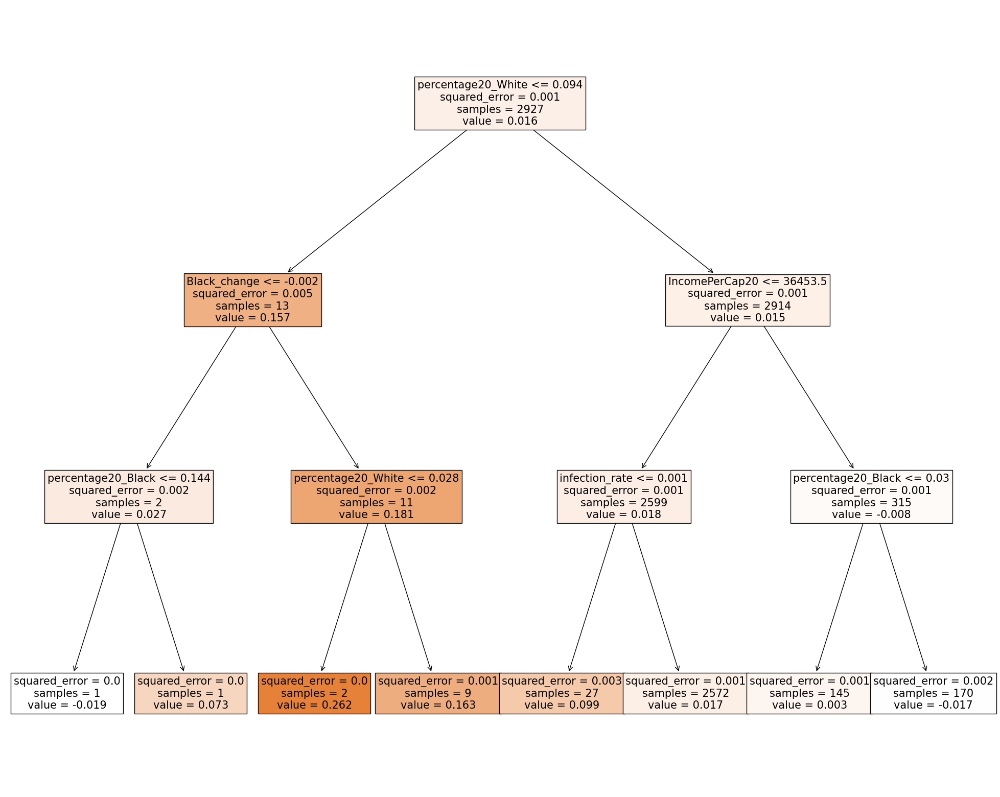

In [34]:
sqrf_fig = plt.figure(figsize=(25,20))
sqrf_fig = tree.plot_tree(sqft_tree, feature_names=X.columns, fontsize=15, filled=True)

The above graph shows the regression tree with depth 3 based on all my variables. Acording to the objection function which is :

$$
\min_{j,s} \left[  \sum_{i: x_{i,j} \leq s, x_i \in R1}
    (y_i - \hat{y}_{R1})^2 +  \sum_{i: x_{i,j} > s, x_i \in R2}
    (y_i - \hat{y}_{R2})^2 \right]
$$

Therefore, the objective function for my regression tree will be:

$$
\min_{j,s} \left[  \sum_{i: Pct20Wht_i \leq 0.094, x_i \in R1}
    (y_i - 0.157)^2 +  \sum_{i: Pct20Wht_i > 0.094, x_i \in R2}
    (y_i - 0.015)^2 \right]
$$

The objective function is to minimize the squared error. The $j, s$ represents the index of the variable and threshold, respectively. In my regression tree, the two regions, R_1 and R_2, are split by the percentage of the White population in 2020, and the threshold here is 0.094. This means all the rows with the percentage of White people in 2020 less or equal to 0.094 are assigned to R1; otherwise, the rest are assigned to R2. In addition, the $\hat{y}_{R1}$ and $\hat{y}_{R1}$ represent the mean value of the y in each region. According to the regression tree, we can observe that the mean change of percentage vote for Trump is 0.157 and 0.015, which are the values of $\hat{y}_{R1}$ and $\hat{y}_{R2}$.

Moreover, we also have the objectiv function for a "pruned" regression tree, which is:

$$
\min_{tree \subset T} \sum (\hat{f}(x)-y)^2 + \alpha|\text{terminal
   nodes in tree}|
$$

For this objective function, it can help us to find a T, which is the terminal node in the tree that can help us to minimize the Residual Sum of Squares $\sum (\hat{f}(x)-y)^2$. The $\hat{f}(x)$ to be the predicted value and $y$ to be the real value. Moreover, the $\alpha$ is one of the regularization parameters which penalize the complexity of the tress. $\alpha$ increases as the tree becomes more complex (i.e., more nodes). The other two regularization parameters are minimum leaf size and maximum tree depth. Both the values of the three regularization parameters will impact our model. I will explain them one by one.

**For the $\alpha$:**

As I explained, the $\alpha$ controls the complexity of a tree. If $\alpha$ is higher, the second term in the objective function gains more weight or importance relative to the first term. The cost of adding one more terminal node is higher. Therefore, the algorithms will not choose to add more nodes, and our tree becomes simple. 

However, if $\alpha$ is getting smaller, then the second term in our objective function is getting smaller. Then the algorithms will solely concentrate on the first term, making  $\sum (\hat{f}(x)-y)^2$ as small as possible. However, remember that if we increase the nodes, then the RSS will definitely decrease and may result in over-fitting ultimately. The tree will be the largest if the value of $\alpha$ is 0. Hence, the $\alpha$ controls the trade-off between complexity and quality of the fit to training data. That is why it can influence our tree.

**For the minimum leaf size:**

This can help to prevent over-fitting. This is because if we set the leaf size to be very small, then the tree will fit each data point and cause over-fitting.

**For Maximum Tree Depth:**

Similar to the $\alpha$, this can help us to limit the complexity in our tree.

Therefore, changing the regularization parameters can affect our models and results.

For our tree, we can see that the root node is the percentage of the white population less or equal to 0.094. This is quite surprising as most white people in most counties are above 70%.

If we go to the left node of the root node, we see that it is now split by the change in the black population from 2016 with a threshold of -0.002. On this node, the mean shift in percentage votes for Trump is 0.157. On the next level, it is split by the percentage of whites and blacks in 2020, respectively. Ultimately, we can observe that if a county has a change of black population larger than -0.002 and has a percentage of white population less than 0.028. Then, these counties may have a mean shift of percentage vote for Trump to be 0.262. In fact, there are only two counties in this rectangle.

Back to the root node, if you go to the right side, we can see that it is split by income per capita in 2020 with a threshold of 36453.9. On the next level, it is divided by the infection rate and percentage of the Black population in 2020. Finally, the counties with an infection rate less than 0.001 have a mean change of percentage vote for Trump to be 0.099, and there are only 27 counties.

0.00010835852791253843

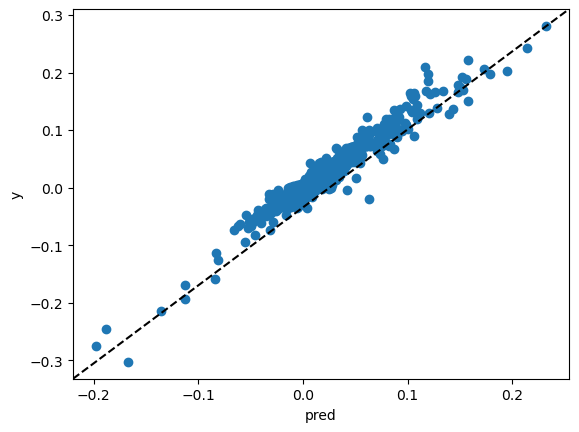

In [35]:
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error,confusion_matrix, classification_report
#Bagging; using all features

regr = RandomForestRegressor(max_features= 5, random_state=1) 
regr.fit(X, y)


pred = regr.predict(X)

plt.scatter(pred, y, label='voting_change')
plt.plot([0, 1], [0, 1], '--k', transform=plt.gca().transAxes)
plt.xlabel('pred')
plt.ylabel('y')

mean_squared_error(y, pred)

The above figure shows the actual values and predicted values of y if we use Random Forest. We can see that almost every point is close to the diagonal line. Moreover, the mean squared error is satisfied, which is about 0.00011.

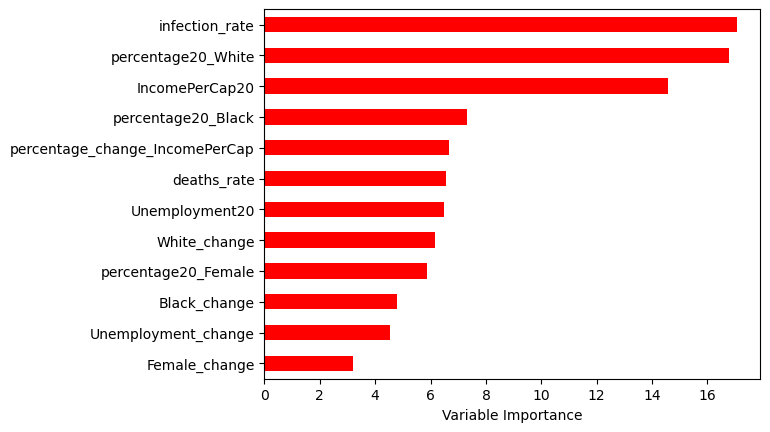

In [36]:
Importance = pd.DataFrame({'Importance':regr.feature_importances_*100}, index=X.columns)
Importance.sort_values('Importance', axis=0, ascending=True).plot(kind='barh', color='r', )
plt.xlabel('Variable Importance')
plt.gca().legend_ = None

The above graph shows the importance matrix for all the independent variables. We can see that the infection rate, percentage of white population at 2020 and income per capita in 2020 in each county are the top three among all variables. Each of these three variables contribute about the 15% of the overall importance. In addition, it seems that the female population change from 2016 is the most unimportant variable, which only contribute 3% overall importance.

In [37]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
parameters = {'max_depth':range(1,20)}
clf = GridSearchCV(tree.DecisionTreeRegressor(), parameters, cv=5) # 5-fold cross-validation
clf.fit(X=X_train, y=y_train)
best_tree_model = clf.best_estimator_

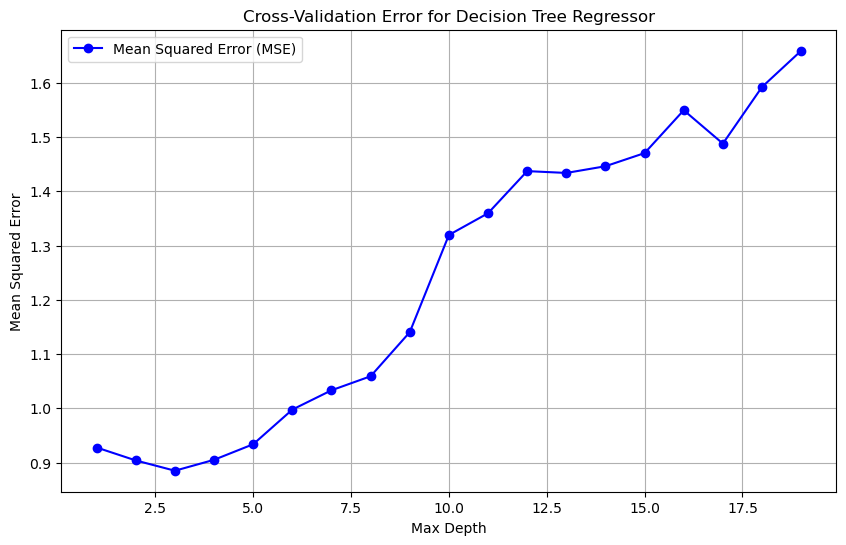

In [38]:
# Extract the cross-validation results
mse_scores = 1 - clf.cv_results_['mean_test_score']
depths = parameters['max_depth']

plt.figure(figsize=(10, 6))
plt.plot(depths, mse_scores, marker='o', color='b', label='Mean Squared Error (MSE)')
plt.xlabel('Max Depth')
plt.ylabel('Mean Squared Error')
plt.title('Cross-Validation Error for Decision Tree Regressor')
plt.legend()
plt.grid(True)
plt.show()

In order to find the max depth of the best tree, we can perform the Cross-validation. The above graph shwos the change between the maximum depth and the mean squared error. Lukily, we can find that the mean square error is lowest when the maxium depth is 3, whcih is the tree we draw. In addition, the positive slope indicates that our model will be over-fitting if we increases the tree depth. Therefore, the best and maximum depth in our model is 3.

# Conclusion

This project investigates the correlation between Donald Trump's loss in the 2020 US Election to COVID and economic indicators. The primary data set I used is from Kaggle [5], which combines US Election data and economic/demographic data for each county. In addition, I merged the four data sets from ACS 5-year estimates [6] in 2016 and 2020 to the original data to better illustrate how the change of certain variables from the last election influenced the election results in 2020.

From Project One to Final Project, all my research is performed step-by-step. In Project One, I visualize certain variables from the original data sets, especially the potential impact of COVID-19 on the vote percentage for Trump in 2020. For project two, I mainly found the main message of this research and drew the maps of both dependent and independent variables to see how the variables are distributed geometrically. Along with the maps, I made the economic intuitions of either COVID metrics or socio-economic and demographic factors to the change of vote for Trump. In the final project, I merged more data sets from ACS and better demonstrated the shift of certain variables from the 2016 Election. Moreover, I created different linear and non-linear regression models to predict the change in Trump's voting share. Then, machine learning techniques such as regression trees and random forest are performed and better illustrate the factors influencing the shift in vote percentage and their relations with each other.

After performing all these procedures, I had some exciting findings that may not align with many academic papers or common sense. 

First of all, it is undoubtedly that COVID influenced the voting patterns for Trump in the 2020 Federal Election, and it is more likely to be negatively related to the vote percentage of Trump. However, they may have some ambiguities as the change in Trump's vote share is proportional to the death rate across each county. However, why I still say there is a negative impact of COVID is that the death rate for each county is relatively low; the mean death rate is only about 0.016%, but the mean infection rate is 2.8%. This indicates that the impact of increasing the death rate on the change of percentage votes can be ignored. 

Secondly, the counties with different income per capita levels seem to have different voting patterns. The higher the income per capita, the less likely to vote for Donald Trump. In other words, Trump is in favor of poorer countries. The best example will be the counties in the south of Taxes, where those counties have the highest COVID-19 infection and death rates, but they had an average of 20% more votes for Trump in 2020. 

Thirdly, whether the country voted for Trump during the last election also plays an essential role. In general, the county voting for Trump in 2016 reduced more support than the county that did not vote for Trump. However, I must admit that the counties voting for Trump last time are crazier and have more fans of Trump, meaning that their votes for Trump will increase by 4.62% if the infection rate increases by 10%. This is because the Republicans always showed less concern for COVID, and so does Trump, making the people living in these countries pay less attention to COVID. This explains why their support increases even if the death rate increases.

Finally, the socio-economic and demographic factors we usually consider in an election also play a role here. In terms of economic factors, it is unsurprising that the higher the change in income per capita from 2016 and the lower the unemployment rate in 2020, the more support for Trump. However, the difference in the unemployment rate from 2016 has a positive impact. The reason may be that those counties with a positive change in the unemployment rate usually have a low income per capita. As I illustrated previously, they are more likely to vote for Trump. In addition, the percentage of White, Black, and Females in 2020 seems negatively related to Trump's vote. This needs more discussion as the reason for a decrease in the population of races might be COVID.

For all these variables, if we plot the regression tree based on all X variables, we can see that the counties with less than 0.028 percentage of white population, positive change of black change had the highest change of percentage vote, which is 0.262. These results match the results from our regression model. In addition, if we plot the importance matrix based on the Random Forest. We can observe that the infection rate, percentage of white population in 2020, and income per capita for each county in 2020 are the top three most important variables. They contribute about 50% overall importance to the model together, matching our linear regression results.

## Limitations

Despite this research finding the potential regression model between COVID metrics and economic and demographic variables to the change of percentage vote for Trump, it still has some limitations. 

Firstly, the variables are lack of scope. Even though the variables in my research contain a variable with different perspectives, adding more variables, such as time and labor force would be better. 

Secondly, the adjusted R square is relatively low. The highest adjusted R square for all my models is just 0.2, which is sometimes less convincing. This can be done by increasing the number of variables or implementing transformations to each variable.

Thirdly, not all the variables in the model are significant. The dummy variable “medium income county” and the interaction between it and the win in 2016 are not significant.

## Future Step

Looking ahead, there are many ways that can improve the behavior of our model. Except for the changes to address the limitations, another thing we can do is to find the casual inference between the voting pattern of True and COVID. With that, we can conclude with a sure answer whether Trump’s failure during the 2020 Election can be attributed to COVID. In addition, to justify the correlation between the COVID infection rate and the votes for Trump, we should perform 2SLS models to illustrate this. This would be beneficial for avoiding the endogeneity.

Furthermore, to make our predictions more accurate and comprehensive, we should include the techniques of Multilevel Regression with Post-stratification in our models. This means dividing the counties into different subgroups and calculating the dependent variables from each cell. However, if we do this, we may need more external data.

\newpage


# Reference
1. David, M. (n.d.). Polarization, partisanship, and pandemic: The relationship between county-level support for Donald Trump and the spread of covid-19 during the spring and summer of 2020. Social science quarterly. https://pubmed.ncbi.nlm.nih.gov/34908615/ 

2. S;, B. L. A. (n.d.). The COVID-19 pandemic and the 2020 US presidential election. Journal of population economics. https://pubmed.ncbi.nlm.nih.gov/33469244/ 

3. Clarke, H., Stewart, M. C., &amp; Ho, K. (n.d.). Did covid-19 kill trump politically? the pandemic and voting in the 2020 presidential election. Social science quarterly. https://pubmed.ncbi.nlm.nih.gov/34226770/ 

4. J;, H. (n.d.). Did the COVID-19 pandemic help or hurt Donald Trump’s political fortunes? PloS one. https://pubmed.ncbi.nlm.nih.gov/33626568/ 

5. Schacht, E. (2020, November 14). Election, COVID, and demographic data by County. Kaggle. https://www.kaggle.com/datasets/etsc9287/2020-general-election-polls?datasetId=506691&amp;select=county_statistics.csv

6. Bureau, U. C. (2023, June 20). American Community Survey (ACS). Census.gov. https://www.census.gov/programs-surveys/acs 